# 1) Importing the Packages

In [8]:
import datetime as dt
import pandas as pd
import numpy as np
import random as rd
import math

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py

import pickle
import gc
import os

from sklearn import preprocessing
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')


plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['axes.grid'] = False

In [ ]:
import plotly.express as px
fig = px.line(train_subset_non_ind,x='date',y='unit_sales',title='Unit sales plot with slider')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['axes.grid'] = False

In [9]:
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.api import VAR

In [ ]:
#exclude the rows with z score more than 4
from scipy.stats import zscore

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
import statsmodels.api as sm

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
from statsmodels.tsa.stattools import kpss

In [ ]:
from statsmodels.tsa.api import ExponentialSmoothing

In [ ]:
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [ ]:
from prophet import Prophet
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
import plotly.express as px

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

# 2)  Reading the Input files

In [10]:
# specify datatypes before loading the data will save you a ton of memory.
dtypes = {'id': np.uint32,
          'store_nbr': np.uint8, 
          'item_nbr': np.uint32, 
          'unit_sales': np.float32,
          'class': np.uint16,
          'dcoilwtico':np.float16,
          'transactions':np.uint16,
          'cluster': np.uint32,
         'onpromotion' : 'object'}

In [11]:
df_train = pd.read_csv(r"C:\users\u2195687\Input\train.csv",parse_dates=['date'],dtype = {
                    'onpromotion': 'object'
               })


In [12]:
df_holiday =  pd.read_csv(r"C:\users\u2195687\Input\holidays_events.csv",parse_dates=['date'])
df_items =  pd.read_csv(r"C:\users\u2195687\Input\items.csv")
df_oil =  pd.read_csv(r"C:\users\u2195687\Input\oil.csv",parse_dates=['date'])
df_stores = pd.read_csv(r"C:\users\u2195687\Input\stores.csv")
df_transactions=pd.read_csv(r"C:\users\u2195687\Input\transactions.csv",parse_dates =['date'])

In [13]:
df_train['Year'] = pd.DatetimeIndex(df_train['date']).year #— to get the year from the date.
df_train['Month'] = pd.DatetimeIndex(df_train['date']).month # To get month from the date.
df_train['Day'] = pd.DatetimeIndex(df_train['date']).day # To get month from the date.

## 2.1) Samples of Each Dataframe

In [4]:
df_train.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [15]:
df_train.describe()

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day
count,1.254970e+08,1.254970e+08,1.254970e+08,1.254970e+08,1.254970e+08,1.254970e+08,1.254970e+08
mean,6.274852e+07,2.746458e+01,9.727692e+05,8.554865e+00,2.015223e+03,6.334971e+00,1.560188e+01
std,3.622788e+07,1.633051e+01,5.205336e+05,2.360515e+01,1.299140e+00,3.392866e+00,8.816411e+00
min,0.000000e+00,1.000000e+00,9.699500e+04,-1.537200e+04,2.013000e+03,1.000000e+00,1.000000e+00
25%,3.137426e+07,1.200000e+01,5.223830e+05,2.000000e+00,2.014000e+03,3.000000e+00,8.000000e+00
50%,6.274852e+07,2.800000e+01,9.595000e+05,4.000000e+00,2.015000e+03,6.000000e+00,1.500000e+01
75%,9.412278e+07,4.300000e+01,1.354380e+06,9.000000e+00,2.016000e+03,9.000000e+00,2.300000e+01
max,1.254970e+08,5.400000e+01,2.127114e+06,8.944000e+04,2.017000e+03,1.200000e+01,3.100000e+01


In [12]:
df_transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


i) Transactions dataset has the store number and the transactions details.<br>
ii) We already know that Store number is also available in the train dataset as well.<br>
iii) Transactions denotes the total number of transactions happened on the particular day with respect to each store.

In [13]:
df_holiday.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [14]:
df_items.head()

,item_nbr,family,class,perishable
0,96995,GROCERY I,1093,0
1,99197,GROCERY I,1067,0
2,103501,CLEANING,3008,0
3,103520,GROCERY I,1028,0
4,103665,BREAD/BAKERY,2712,1


i) Item dataset has the item number, family, class and perishable( likely to decay) <br>

In [15]:
df_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [16]:
df_stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


Using the above details , we need to find the Unit_sales prediction for the future year <br>

## 2.2) More details of Dataframes

In [24]:
df_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125497040 entries, 0 to 125497039
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   item_nbr     int64         
 4   unit_sales   float64       
 5   onpromotion  object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 5.6+ GB


In [31]:
df_train.shape

(125497040, 6)

It has 12 million records which is very huge. so, we can consider the sales only for some records.<br>
After visualisation , we can decide the factors to select records.


In [25]:
df_holiday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [26]:
df_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4100 entries, 0 to 4099
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   item_nbr    4100 non-null   int64 
 1   family      4100 non-null   object
 2   class       4100 non-null   int64 
 3   perishable  4100 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 128.2+ KB


In [27]:
df_oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


In [28]:
df_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [29]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB


Date fields are of datetime type as we specify the dtype while importing. we can also create the day , month and year feature from the date feature

# 3) Visualisation of Each dataframes

## 3.1) Train

<AxesSubplot:xlabel='Year', ylabel='Unit Sales'>

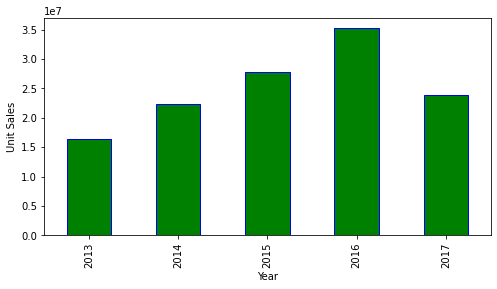

In [43]:
plt.figure(figsize=(8,4))
df_train['Year'].value_counts(sort = False).plot.bar(y=['unit_sales'],color=['green'],edgecolor='blue',xlabel='Year',
                                                     ylabel='Unit Sales')


2016 have the largest number of sales. 

<AxesSubplot:xlabel=' Month ', ylabel='Unit Sales'>

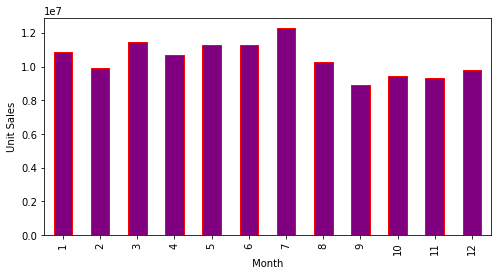

In [44]:
plt.figure(figsize=(8,4))
df_train['Month'].value_counts(sort = False).plot.bar(y=['unit_sales'],color=['Purple'],edgecolor='red',
                                                     xlabel = ' Month ',ylabel='Unit Sales')

The distributions are more or less equal with respect to the months

<AxesSubplot:xlabel=' Day ', ylabel='Unit Sales'>

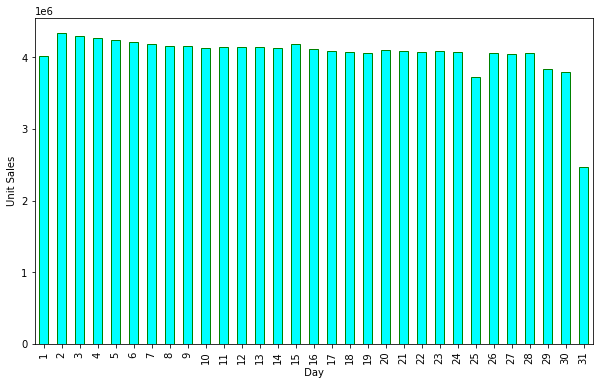

In [19]:
plt.figure(figsize=(10,6))
df_train['Day'].value_counts(sort = False).plot.bar(y=['unit_sales'],color=['cyan'],edgecolor='green',
                                                   xlabel = ' Day ',ylabel='Unit Sales')

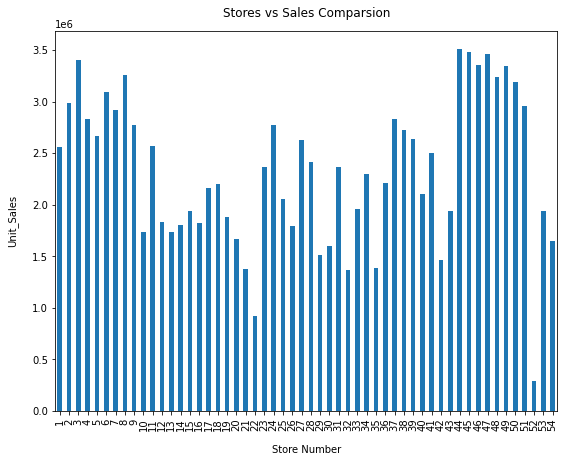

In [17]:
plt.figure(figsize=(20,8))
df_train['store_nbr'].sort_values().value_counts(sort = False).plot.bar(figsize=(9, 7))
#value_counts sorts the values by descending frequencies by default. Disable sorting using sort=False:
plt.xlabel("Store Number", labelpad=14)
plt.ylabel("Unit_Sales", labelpad=14)
plt.title("Stores vs Sales Comparsion", y=1.02);

<AxesSubplot:>

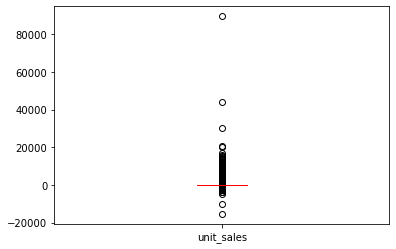

In [18]:
df_train.boxplot(column =['unit_sales'], grid = False,color='red')

<AxesSubplot:xlabel='onpromotion', ylabel='count'>

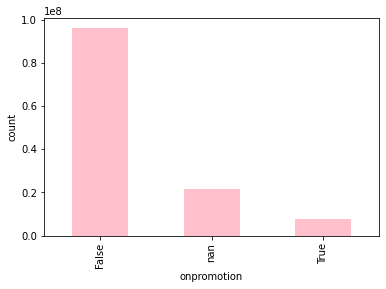

In [27]:
df_train['onpromotion'].value_counts(dropna=False).plot.bar(color='aqua',xlabel='onpromotion',ylabel='count')

## 3.2) Transactions

In [6]:
#df_transactions['Year'] = pd.DatetimeIndex(df_transactions['date']).year #— to get the year from the date.
#df_transactions['Month'] = pd.DatetimeIndex(df_transactions['date']).month # To get month from the date.
#df_transactions['Day'] = pd.DatetimeIndex(df_transactions['date']).day # To get month from the date.

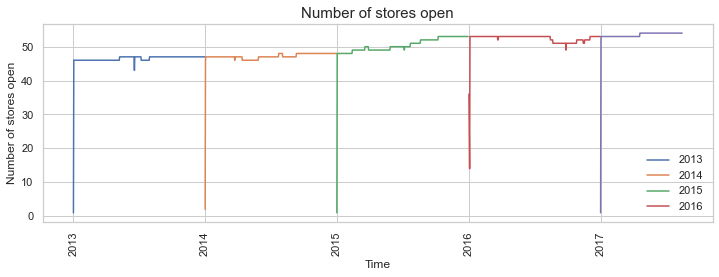

In [94]:
#transactions
# month over month sales
df_transactions['date']=pd.to_datetime(df_transactions['date'])
temp=df_transactions.groupby(['date']).aggregate({'store_nbr':'count','transactions':np.sum})
temp=temp.reset_index()
temp_2013=temp[temp['date'].dt.year==2013].reset_index(drop=True)
temp_2014=temp[temp['date'].dt.year==2014].reset_index(drop=True)
temp_2015=temp[temp['date'].dt.year==2015].reset_index(drop=True)
temp_2016=temp[temp['date'].dt.year==2016].reset_index(drop=True)
temp_2017=temp[temp['date'].dt.year==2017].reset_index(drop=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(12,8))
plt.subplot(211)
plt.plot(temp_2013['date'],temp_2013.iloc[:,1],label="2013")
plt.plot(temp_2014['date'],temp_2014.iloc[:,1],label="2014")
plt.plot(temp_2015['date'],temp_2015.iloc[:,1],label="2015")
plt.plot(temp_2016['date'],temp_2016.iloc[:,1],label="2016")
plt.plot(temp_2017['date'],temp_2017.iloc[:,1],label="2017")
plt.ylabel('Number of stores open', fontsize=12)
plt.xlabel('Time', fontsize=12)
plt.title('Number of stores open', fontsize=15)
plt.xticks(rotation='vertical')
plt.legend(['2013', '2014', '2015', '2016'], loc='lower right')

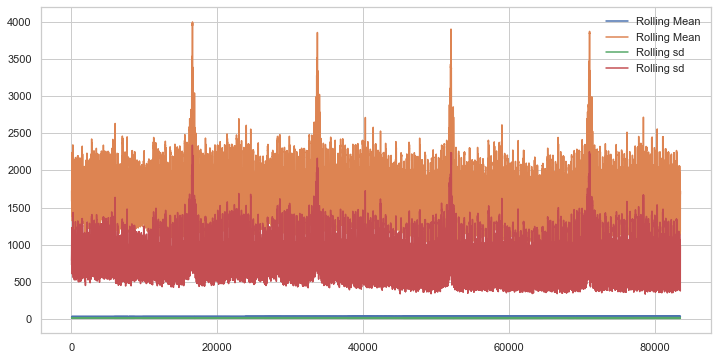

In [89]:
plt.figure(figsize=(12,6))
plt.plot(df_transactions.rolling(window=30,center=False).mean(),label='Rolling Mean');
plt.plot(df_transactions.rolling(window=30,center=False).std(),label='Rolling sd');
plt.legend();

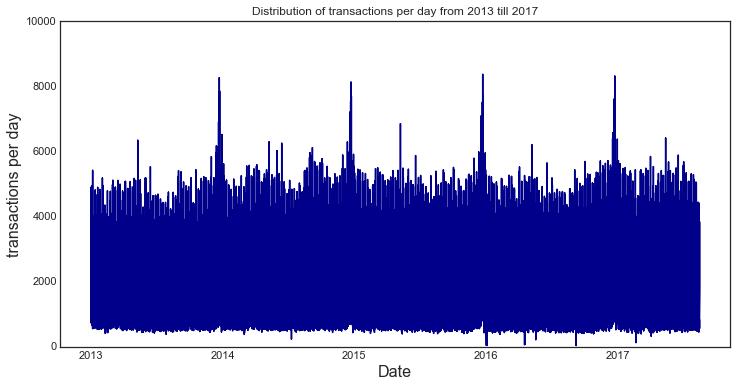

In [95]:
plt.style.use('seaborn-white')
plt.figure(figsize=(12,6))
plt.plot(df_transactions.date.values, df_transactions.transactions.values, color='darkblue')
plt.ylim(-50, 10000)
plt.title("Distribution of transactions per day from 2013 till 2017")
plt.ylabel('transactions per day', fontsize= 16)
plt.xlabel('Date', fontsize= 16)
plt.show()

## 3.3) Items

<AxesSubplot:xlabel='Perishable Items', ylabel='count'>

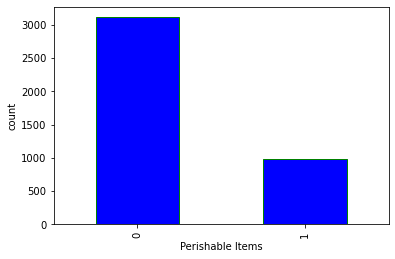

In [48]:
df_items['perishable'].value_counts(sort = False).plot.bar(color=['blue'],edgecolor='green',
                                                           xlabel='Perishable Items',ylabel='count')

<AxesSubplot:xlabel='Item Family', ylabel='count'>

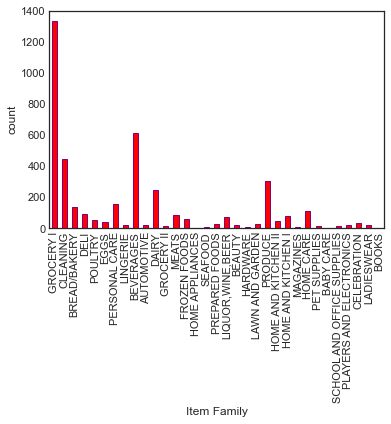

In [97]:
figsize=(24,40)
df_items['family'].value_counts(sort = False).plot.bar(color=['red'],edgecolor='purple',
                                                       xlabel='Item Family',ylabel='count')

## 3.4) Stores

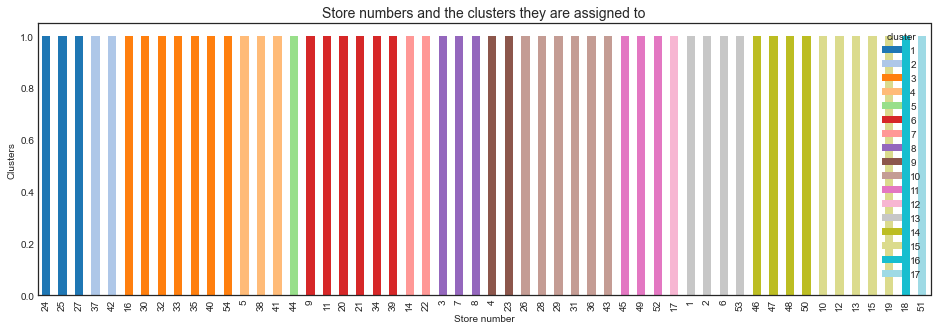

In [78]:
 plt.style.use('seaborn-white')
 nbr_cluster = df_stores.groupby(['store_nbr','cluster']).size()
 nbr_cluster.unstack().iloc[neworder].plot(kind='bar',stacked=True, colormap= 'tab20', figsize=(16,5),  grid=False)
 plt.title('Store numbers and the clusters they are assigned to', fontsize=14)
 plt.ylabel('Clusters')
 plt.xlabel('Store number')
 plt.show()

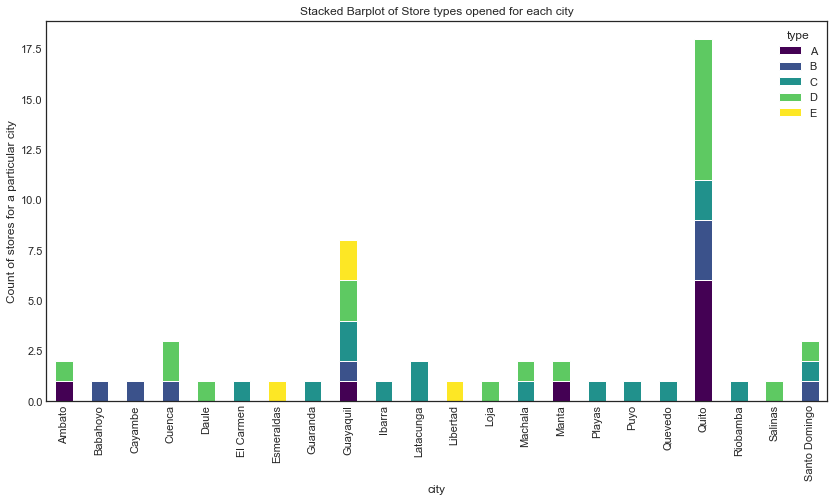

In [98]:
plt.style.use('seaborn-white')
city_cluster = df_stores.groupby(['city','type']).store_nbr.size()
city_cluster.unstack().plot(kind='bar',stacked=True, colormap= 'viridis', figsize=(14,7),  grid=False)
plt.title('Stacked Barplot of Store types opened for each city')
plt.ylabel('Count of stores for a particular city')
plt.show()

## 3.5) Oil

In [7]:
#df_oil['Year'] = pd.DatetimeIndex(df_oil['date']).year #— to get the year from the date.
#df_oil['Month'] = pd.DatetimeIndex(df_oil['date']).month # To get month from the date.
#df_oil['Day'] = pd.DatetimeIndex(df_oil['date']).day # To get month from the date.

In [19]:
 trace = go.Scatter(
     name='Oil prices',
     x=df_oil['date'],
     y=df_oil['dcoilwtico'].dropna(),
     mode='lines',
     line=dict(color='rgb(25, 15, 200, 0.5)'),
     #fillcolor='rgba(68, 68, 68, 0.3)',
     fillcolor='rgba(0, 1, 219, 0.4)',
     fill='tonexty' )

 data = [trace]

 layout = go.Layout(
     yaxis=dict(title='Daily Oil price'),
     title='Daily oil prices from Jan 2013 till July 2017',
     showlegend = False)
 fig = go.Figure(data=data, layout=layout)
 py.iplot(fig, filename='pandas-time-series-error-bars')

## 3.6) Holiday

In [8]:
#df_holiday['Year'] = pd.DatetimeIndex(df_holiday['date']).year #— to get the year from the date.
#df_holiday['Month'] = pd.DatetimeIndex(df_holiday['date']).month # To get month from the date.
#df_holiday['Day'] = pd.DatetimeIndex(df_holiday['date']).day # To get month from the date.

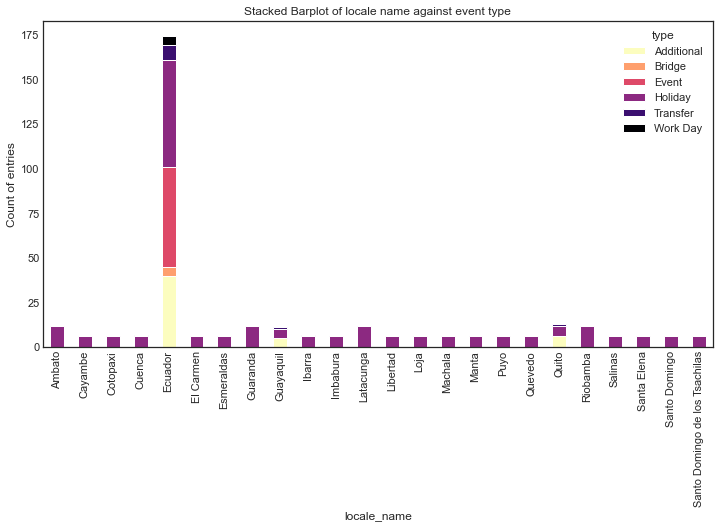

In [103]:
plt.style.use('seaborn-white')
holiday_local_type = df_holiday.groupby(['locale_name', 'type']).size()
holiday_local_type.unstack().plot(kind='bar',stacked=True, colormap= 'magma_r', figsize=(12,6),  grid=False)
plt.title('Stacked Barplot of locale name against event type')
plt.ylabel('Count of entries')
plt.show()

# 4) Creating new Dataframe with filtered data

In [14]:
year_nbr = [2015,2016,2017]

####  Year Dataframe

In [15]:
df_trainyr = df_train[df_train['Year'].isin(year_nbr)]
print(df_trainyr.shape)

(86902776, 9)


In [36]:
print(df_train.shape)

(125497040, 9)


## 4.1) Filtering based on conditions


In [37]:
df_trainyr.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day
38594264,38594264,2015-01-01,25,103665,12.0,False,2015,1,1
38594265,38594265,2015-01-01,25,105575,23.0,False,2015,1,1
38594266,38594266,2015-01-01,25,108634,1.0,False,2015,1,1
38594267,38594267,2015-01-01,25,108698,6.0,False,2015,1,1
38594268,38594268,2015-01-01,25,108786,6.0,False,2015,1,1


In [38]:
item_num = df_items.loc[df_items['family']=='EGGS']['item_nbr'].tolist()
print(item_num)

[108833, 127547, 158680, 208384, 208386, 227111, 258268, 357961, 357962, 357963, 376427, 407499, 407500, 457424, 457425, 476261, 507478, 507479, 525902, 557256, 557257, 575875, 575876, 617092, 617096, 617103, 617113, 679926, 902198, 902200, 902202, 1082907, 1089163, 1148548, 1162755, 1162759, 1167614, 1259006, 1259007, 1320701, 1974848]


####  Egg Dataframe

In [39]:
df_egg = df_trainyr[df_trainyr['item_nbr'].isin(item_num)]

In [40]:
print(df_egg.shape)

(967504, 9)


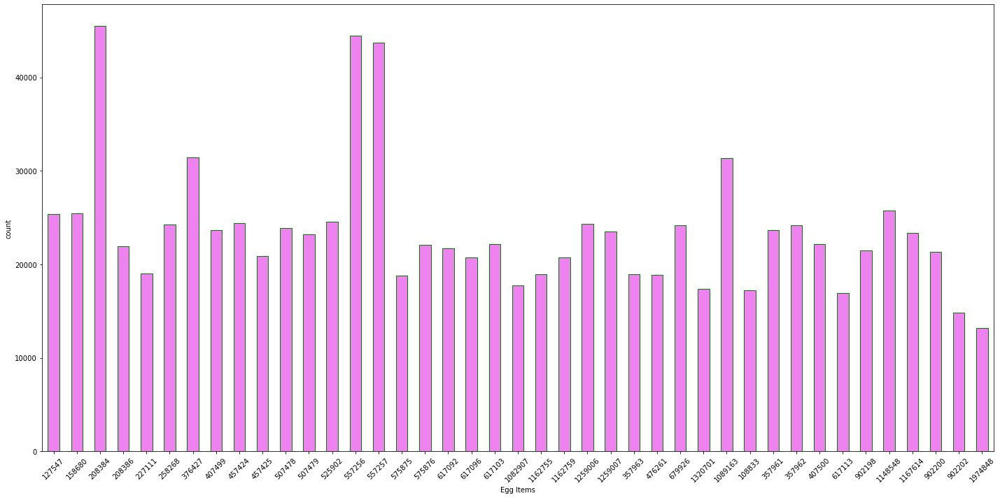

In [41]:
df_egg['item_nbr'].value_counts(sort = False).plot.bar(color=['violet'],edgecolor='green',
                                                           xlabel='Egg Items',ylabel='count',figsize = (20,10))
plt.xticks(rotation=45)
plt.tight_layout()

In [42]:
df_eggmin = df_egg[df_egg['item_nbr']==1974848]
df_eggmax = df_egg[df_egg['item_nbr']==208384]

In [43]:
print(df_eggmin.shape)
print(df_eggmax.shape)

(13166, 9)
(45526, 9)


so let us proceed with the dataframe df_eggmin

In [44]:
df_eggmax.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45526 entries, 38594342 to 125493975
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           45526 non-null  int64         
 1   date         45526 non-null  datetime64[ns]
 2   store_nbr    45526 non-null  int64         
 3   item_nbr     45526 non-null  int64         
 4   unit_sales   45526 non-null  float64       
 5   onpromotion  45526 non-null  object        
 6   Year         45526 non-null  int64         
 7   Month        45526 non-null  int64         
 8   Day          45526 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(6), object(1)
memory usage: 3.5+ MB


In [45]:
df_eggmax.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day
38594342,38594342,2015-01-01,25,208384,37.0,False,2015,1,1
38595506,38595506,2015-01-02,1,208384,27.0,True,2015,1,2
38596664,38596664,2015-01-02,2,208384,22.0,True,2015,1,2
38598159,38598159,2015-01-02,3,208384,92.0,True,2015,1,2
38599830,38599830,2015-01-02,4,208384,14.0,True,2015,1,2


<AxesSubplot:>

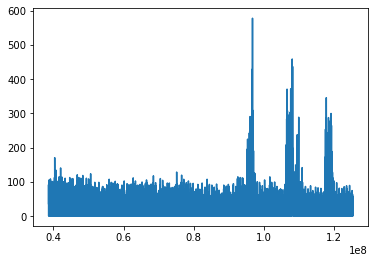

In [46]:
df_eggmax['unit_sales'].plot()

## 4.2) Merging with other Dataframes

In [62]:
# Left Join - Train & Items 
train_subset = pd.merge(df_eggmax, df_items, on = 'item_nbr', how = 'left')
train_subset.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable
0,38594342,2015-01-01,25,208384,37.0,False,2015,1,1,EGGS,2502,1
1,38595506,2015-01-02,1,208384,27.0,True,2015,1,2,EGGS,2502,1
2,38596664,2015-01-02,2,208384,22.0,True,2015,1,2,EGGS,2502,1
3,38598159,2015-01-02,3,208384,92.0,True,2015,1,2,EGGS,2502,1
4,38599830,2015-01-02,4,208384,14.0,True,2015,1,2,EGGS,2502,1


In [63]:
# Left Join - merged & Store 
train_subset = pd.merge(train_subset, df_stores, on = 'store_nbr', how = 'left')
train_subset.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable,city,state,type,cluster
0,38594342,2015-01-01,25,208384,37.0,False,2015,1,1,EGGS,2502,1,Salinas,Santa Elena,D,1
1,38595506,2015-01-02,1,208384,27.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13
2,38596664,2015-01-02,2,208384,22.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13
3,38598159,2015-01-02,3,208384,92.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,8
4,38599830,2015-01-02,4,208384,14.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,9


In [64]:
# Left Join - merged & Oil
train_subset = pd.merge(train_subset, df_oil, on = 'date', how = 'left')
train_subset.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable,city,state,type,cluster,dcoilwtico
0,38594342,2015-01-01,25,208384,37.0,False,2015,1,1,EGGS,2502,1,Salinas,Santa Elena,D,1,NaN
1,38595506,2015-01-02,1,208384,27.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13,52.72
2,38596664,2015-01-02,2,208384,22.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13,52.72
3,38598159,2015-01-02,3,208384,92.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,8,52.72
4,38599830,2015-01-02,4,208384,14.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,9,52.72


In [65]:
# Left Join - Train & Holiday
train_subset = pd.merge(train_subset, df_holiday, on = 'date', how = 'left')
train_subset.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,...,city,state,type_x,cluster,dcoilwtico,type_y,locale,locale_name,description,transferred
0,38594342,2015-01-01,25,208384,37.0,False,2015,1,1,EGGS,...,Salinas,Santa Elena,D,1,NaN,Holiday,National,Ecuador,Primer dia del ano,False
1,38595506,2015-01-02,1,208384,27.0,True,2015,1,2,EGGS,...,Quito,Pichincha,D,13,52.72,Bridge,National,Ecuador,Puente Primer dia del ano,False
2,38596664,2015-01-02,2,208384,22.0,True,2015,1,2,EGGS,...,Quito,Pichincha,D,13,52.72,Bridge,National,Ecuador,Puente Primer dia del ano,False
3,38598159,2015-01-02,3,208384,92.0,True,2015,1,2,EGGS,...,Quito,Pichincha,D,8,52.72,Bridge,National,Ecuador,Puente Primer dia del ano,False
4,38599830,2015-01-02,4,208384,14.0,True,2015,1,2,EGGS,...,Quito,Pichincha,D,9,52.72,Bridge,National,Ecuador,Puente Primer dia del ano,False


In [67]:
train_subset.columns

Index(['id', 'date', 'store_nbr', 'item_nbr', 'unit_sales', 'onpromotion',
       'Year', 'Month', 'Day', 'family', 'class', 'perishable', 'city',
       'state', 'type_x', 'cluster', 'dcoilwtico', 'type_y', 'locale',
       'locale_name', 'description', 'transferred'],
      dtype='object')

In [68]:
train_subset = train_subset.drop(['locale', 'locale_name','description','transferred'], axis=1)


In [69]:
train_subset = train_subset.rename(columns={"type_y": "day_type", "type_x": "type","dcoilwtico":"oil_price"})

In [70]:
train_subset.describe()

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
count,4.645800e+04,46458.000000,46458.0,46458.000000,46458.000000,46458.000000,46458.000000,46458.0,46458.0,46458.000000,31363.000000
mean,7.927775e+07,27.347045,208384.0,15.937557,2015.879762,6.010052,15.632636,2502.0,1.0,8.479121,46.738771
std,2.566524e+07,15.696945,0.0,20.012322,0.774293,3.301916,8.799233,0.0,0.0,4.623320,6.728534
min,3.859434e+07,1.000000,208384.0,1.000000,2015.000000,1.000000,1.000000,2502.0,1.0,1.000000,26.190000
25%,5.617923e+07,14.000000,208384.0,4.000000,2015.000000,3.000000,8.000000,2502.0,1.0,4.000000,43.870000
50%,7.832521e+07,28.000000,208384.0,9.000000,2016.000000,6.000000,15.000000,2502.0,1.0,9.000000,47.280000
75%,1.013656e+08,41.000000,208384.0,21.000000,2016.000000,9.000000,23.000000,2502.0,1.0,13.000000,50.610000
max,1.254940e+08,54.000000,208384.0,578.000000,2017.000000,12.000000,31.000000,2502.0,1.0,17.000000,61.360000


In [71]:
train_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46458 entries, 0 to 46457
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           46458 non-null  int64         
 1   date         46458 non-null  datetime64[ns]
 2   store_nbr    46458 non-null  int64         
 3   item_nbr     46458 non-null  int64         
 4   unit_sales   46458 non-null  float64       
 5   onpromotion  46458 non-null  object        
 6   Year         46458 non-null  int64         
 7   Month        46458 non-null  int64         
 8   Day          46458 non-null  int64         
 9   family       46458 non-null  object        
 10  class        46458 non-null  int64         
 11  perishable   46458 non-null  int64         
 12  city         46458 non-null  object        
 13  state        46458 non-null  object        
 14  type         46458 non-null  object        
 15  cluster      46458 non-null  int64         
 16  oil_

In [72]:
train_subset

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable,city,state,type,cluster,oil_price,day_type
0,38594342,2015-01-01,25,208384,37.0,False,2015,1,1,EGGS,2502,1,Salinas,Santa Elena,D,1,NaN,Holiday
1,38595506,2015-01-02,1,208384,27.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13,52.72,Bridge
2,38596664,2015-01-02,2,208384,22.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,13,52.72,Bridge
3,38598159,2015-01-02,3,208384,92.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,8,52.72,Bridge
4,38599830,2015-01-02,4,208384,14.0,True,2015,1,2,EGGS,2502,1,Quito,Pichincha,D,9,52.72,Bridge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46453,125484394,2017-08-15,49,208384,26.0,False,2017,8,15,EGGS,2502,1,Quito,Pichincha,A,11,47.57,Holiday
46454,125487020,2017-08-15,50,208384,2.0,False,2017,8,15,EGGS,2502,1,Ambato,Tungurahua,A,14,47.57,Holiday
46455,125489400,2017-08-15,51,208384,28.0,False,2017,8,15,EGGS,2502,1,Guayaquil,Guayas,A,17,47.57,Holiday
46456,125491619,2017-08-15,52,208384,28.0,False,2017,8,15,EGGS,2502,1,Manta,Manabi,A,11,47.57,Holiday


In [74]:
train_subsetbkp = train_subset.copy()

In [75]:
train_subset = train_subset.set_index('date')

## 4.3) Resampling to Business days

In [76]:
#train_subset_m = train_subset.resample('M').mean()
#train_subset_m.shape
# Monthly

In [88]:
train_subset_d = train_subset.resample('B').mean()
train_subset_d.shape
#print(train_subset_d.isnull().sum())
#Business Days

(684, 11)

In [78]:
train_subset_with = train_subset.resample('D').mean()
train_subset_with.shape
#Daily - with holidays- facing lot of Nans

(958, 11)

In [79]:
train_subset_dbkp = train_subset_d.copy()
#Back up in another dataframe 

In [89]:
train_subset_d

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
date,,,,,,,,,,,
2015-01-01,3.859434e+07,25.000000,208384.0,37.000000,2015.0,1.0,1.000000,2502.0,1.0,1.000000,NaN
2015-01-02,3.868373e+07,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72
2015-01-05,3.880926e+07,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81


# 5) Exploratory Data Analysis

Basic Analysis

In [80]:
print("Rows :",train_subset_d.shape[0])
print("Columns :",train_subset_d.shape[1])
print("\n Features :",train_subset_d.columns.tolist())
print("\n Missing Values :",train_subset_d.isnull().sum())
print("\n Unique Values :",train_subset_d.nunique()) 


Rows : 684
Columns : 11

 Features : ['id', 'store_nbr', 'item_nbr', 'unit_sales', 'Year', 'Month', 'Day', 'class', 'perishable', 'cluster', 'oil_price']

 Missing Values : id             0
store_nbr      0
item_nbr       0
unit_sales     0
Year           0
Month          0
Day            0
class          0
perishable     0
cluster        0
oil_price     25
dtype: int64

 Unique Values : id            684
store_nbr     515
item_nbr        1
unit_sales    628
Year            4
Month          21
Day           154
class           1
perishable      1
cluster       376
oil_price     576
dtype: int64


Its evident that the column item_nbr ,family , class and perishable have only one value so we can drop them. Also, the missing values are available in the fields oil_price and day_type


Indexing - this allows Querying of the date easily and also data retrieval works fine here.At the same time, time series needs date as the index

Querying the date (We can pass the indexed value in the loc function for effective querying)

In [81]:
train_subset_d.loc['2017']

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
date,,,,,,,,,,,
2017-01-02,1.017459e+08,27.440000,208384.0,22.420000,2017.0,1.0,2.000000,2502.0,1.0,8.520000,NaN
2017-01-03,1.018579e+08,27.125000,208384.0,18.500000,2017.0,1.0,3.000000,2502.0,1.0,8.750000,52.36
2017-01-04,1.019669e+08,27.500000,208384.0,14.600000,2017.0,1.0,4.000000,2502.0,1.0,8.520000,53.26
2017-01-05,1.020727e+08,28.276596,208384.0,12.361702,2017.0,1.0,5.000000,2502.0,1.0,8.468085,53.77
2017-01-06,1.022850e+08,27.225166,208384.0,15.483444,2017.0,1.0,7.033113,2502.0,1.0,8.437086,53.98
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81


In [82]:
train_subset_d.loc['2016':'2017']

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
date,,,,,,,,,,,
2016-01-01,6.656135e+07,26.960000,208384.0,21.360000,2016.0,1.0,2.520000,2502.0,1.0,8.480000,NaN
2016-01-04,6.670822e+07,26.775510,208384.0,19.551020,2016.0,1.0,4.000000,2502.0,1.0,8.285714,36.81
2016-01-05,6.680518e+07,27.666667,208384.0,15.755556,2016.0,1.0,5.000000,2502.0,1.0,7.822222,35.97
2016-01-06,6.689838e+07,27.100000,208384.0,14.140000,2016.0,1.0,6.000000,2502.0,1.0,8.680000,33.97
2016-01-07,6.699207e+07,28.204545,208384.0,11.545455,2016.0,1.0,7.000000,2502.0,1.0,8.545455,33.29
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81


## 5.1 Plotting the Variables

In [83]:
train_subset_data = train_subset_d['unit_sales']
train_subset_data.head()

date
2015-01-01    37.000000
2015-01-02    25.283465
2015-01-05    23.875000
2015-01-06    17.809524
2015-01-07    17.488372
Freq: B, Name: unit_sales, dtype: float64

<AxesSubplot:xlabel='date'>

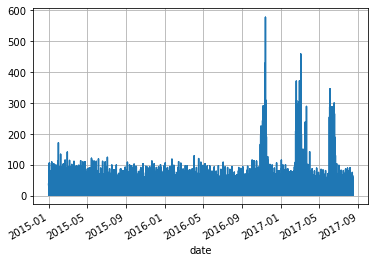

In [27]:
train_subset_data.plot(grid=True,xlabel='Date',Ylabel='Unit_Sales')


Year 2015 Plot

<AxesSubplot:xlabel='date'>

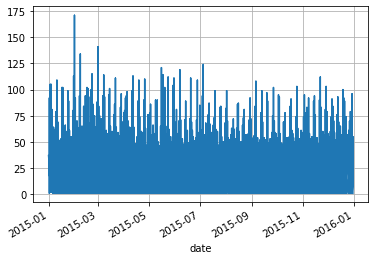

In [85]:
train_2015 = train_subset['2015']
sales_train_2015 = train_2015['unit_sales']
sales_train_2015.plot(grid=True)

Year 2016 Plot

<AxesSubplot:xlabel='date'>

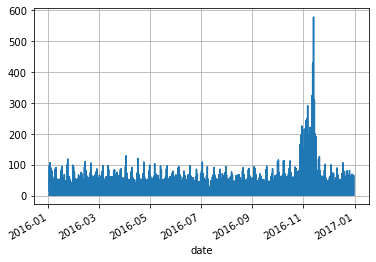

In [36]:
train_2016 = train_subset['2016']
sales_train_2016 = train_2016['unit_sales']
sales_train_2016.plot(grid=True)

Year 2017 Plot

<AxesSubplot:xlabel='date'>

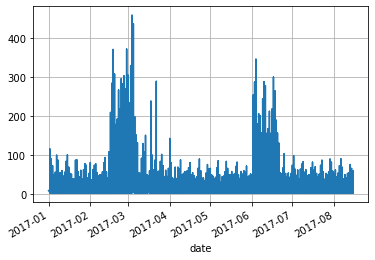

In [37]:
train_2017 = train_subset['2017']
sales_train_2017 = train_2017['unit_sales']
sales_train_2017.plot(grid=True)

In [38]:
import plotly.express as px
fig = px.line(train_subset_non_ind,x='date',y='unit_sales',title='Unit sales plot with slider')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [39]:
fig = px.line(train_subset_non_ind,x='date',y='unit_sales',title='Unit sales plot with slider and Buttons')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector = dict(
         buttons =list([
             dict(count=1,label='Part1',step='year',stepmode='backward'),
             dict(count=2,label='Part2',step='year',stepmode='backward'),
             dict(count=3,label='Part3',step='year',stepmode='backward'),
             dict(step='all')
         ])
    )
)
fig.show()

Histogram

array([[<AxesSubplot:title={'center':'unit_sales'}>]], dtype=object)

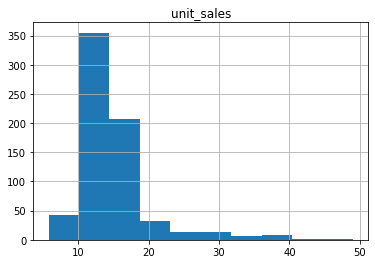

In [86]:
train_subset_d[['unit_sales']].hist()

<AxesSubplot:ylabel='Density'>

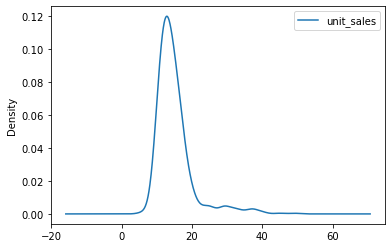

In [90]:
train_subset_d[['unit_sales']].plot(kind='density')

Lag Plot:
      They will show the relationship between the current period and the lag period. Linear shape suggest that a Autoregressive can be applied. This is used to check linearity , randomness , Outliers and check autocorrelation as well

First Order

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

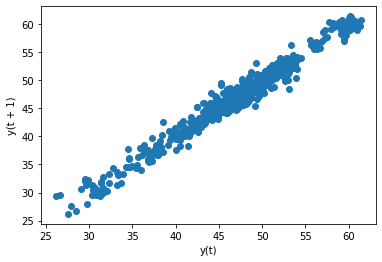

In [91]:
pd.plotting.lag_plot(train_subset_d['oil_price'],lag=1)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 30)'>

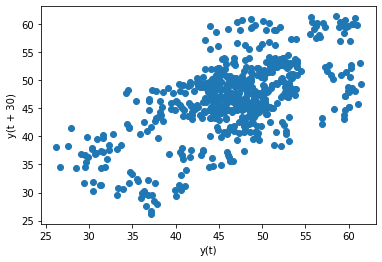

In [95]:
pd.plotting.lag_plot(train_subset_d['oil_price'],lag=30)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 365)'>

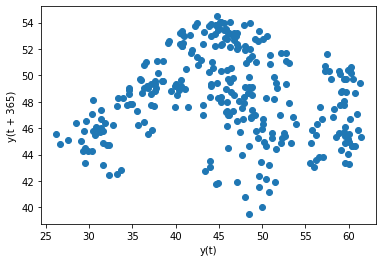

In [96]:
pd.plotting.lag_plot(train_subset_d['oil_price'],lag=365)

Second Order

SNS plot

In [97]:
train_corr = train_subset_d[['unit_sales','cluster','oil_price']].corr(method='pearson')
train_corr

,unit_sales,cluster,oil_price
unit_sales,1.000000,-0.096013,0.059703
cluster,-0.096013,1.000000,0.200319
oil_price,0.059703,0.200319,1.000000


Cluster and oil_price is the only pair with a correlation value of 0.20. others are having less than 1

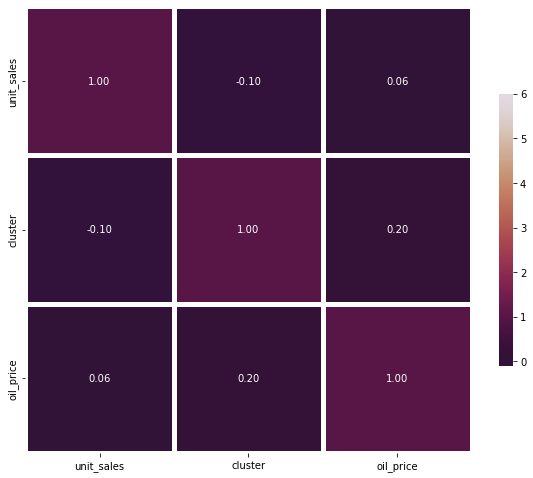

In [98]:
g = sns.heatmap(train_corr,vmax=6,center=0,
               square = True,linewidths=5,cbar_kws = {'shrink':.5},annot=True,fmt='.2f',cmap='twilight')
g.figure.set_size_inches(10,10)

## 5.2) Missing Values

In [99]:
# Train Dataset
train_subset_d.isnull().sum()

id             0
store_nbr      0
item_nbr       0
unit_sales     0
Year           0
Month          0
Day            0
class          0
perishable     0
cluster        0
oil_price     25
dtype: int64

Displaying the affected records

In [36]:
train_subset.query('oil_price != oil_price')

,id,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable,city,state,type,cluster,oil_price,day_type
date,,,,,,,,,,,,,,,,,
2015-01-01,38594342,25,208384,37.0,False,2015,1,1,EGGS,2502,1,Salinas,Santa Elena,D,1,NaN,Holiday
2015-01-03,38656458,1,208384,16.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,13,NaN,NaN
2015-01-03,38657639,2,208384,33.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,13,NaN,NaN
2015-01-03,38659167,3,208384,105.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,8,NaN,NaN
2015-01-03,38660839,4,208384,21.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,9,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-13,125277837,49,208384,49.0,False,2017,8,13,EGGS,2502,1,Quito,Pichincha,A,11,NaN,NaN
2017-08-13,125283093,51,208384,30.0,False,2017,8,13,EGGS,2502,1,Guayaquil,Guayas,A,17,NaN,NaN
2017-08-13,125285496,52,208384,46.0,False,2017,8,13,EGGS,2502,1,Manta,Manabi,A,11,NaN,NaN


In [37]:
train_subset.query('day_type!=day_type')

,id,store_nbr,item_nbr,unit_sales,onpromotion,Year,Month,Day,family,class,perishable,city,state,type,cluster,oil_price,day_type
date,,,,,,,,,,,,,,,,,
2015-01-03,38656458,1,208384,16.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,13,NaN,NaN
2015-01-03,38657639,2,208384,33.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,13,NaN,NaN
2015-01-03,38659167,3,208384,105.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,8,NaN,NaN
2015-01-03,38660839,4,208384,21.0,False,2015,1,3,EGGS,2502,1,Quito,Pichincha,D,9,NaN,NaN
2015-01-03,38662300,5,208384,18.0,True,2015,1,3,EGGS,2502,1,Santo Domingo,Santo Domingo de los Tsachilas,D,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-14,125384221,50,208384,2.0,False,2017,8,14,EGGS,2502,1,Ambato,Tungurahua,A,14,47.59,NaN
2017-08-14,125386639,51,208384,9.0,False,2017,8,14,EGGS,2502,1,Guayaquil,Guayas,A,17,47.59,NaN
2017-08-14,125388822,52,208384,37.0,False,2017,8,14,EGGS,2502,1,Manta,Manabi,A,11,47.59,NaN


### 5.2.1) Oil_price Filling

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 24)'>

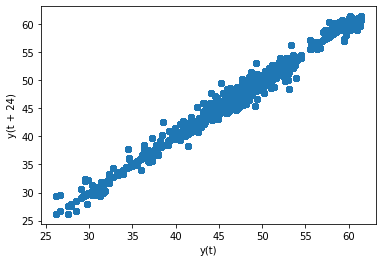

In [38]:
pd.plotting.lag_plot(train_subset['oil_price'],lag=24)

As per the above plot, there is a lineraity with the previous lag for the current lag in oil_price so we can fill the values #
with forward fill(take prev values and fill next value). we can also apply bfill inplace of ffill to fill backwards
(takes future values and take). but backward is not preferrable because furure value will not be available in some business
scenario.

In [100]:
train_subset_d['oil_price'] = train_subset_d['oil_price'].fillna(method='ffill')

In [101]:
train_subset_d.isnull().sum()

id            0
store_nbr     0
item_nbr      0
unit_sales    0
Year          0
Month         0
Day           0
class         0
perishable    0
cluster       0
oil_price     1
dtype: int64

In [102]:
train_subset_d['oil_price'] = train_subset_d['oil_price'].fillna(method='bfill')

In [104]:
train_subset_d.isnull().sum()

id            0
store_nbr     0
item_nbr      0
unit_sales    0
Year          0
Month         0
Day           0
class         0
perishable    0
cluster       0
oil_price     0
dtype: int64

## 5.3) Anomaly Detection

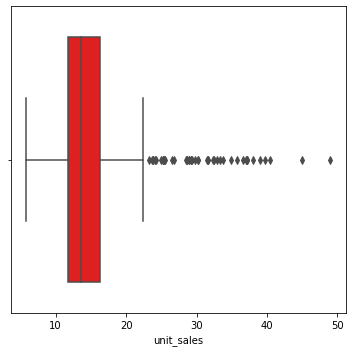

In [106]:
# Outlier Analysis
fig, axs = plt.subplots(1, figsize = (5,5))
plt1 = sns.boxplot(train_subset_d['unit_sales'],color='red')
#plt2 = sns.boxplot(advertising['Newspaper'], ax = axs[1])
#plt3 = sns.boxplot(advertising['Radio'], ax = axs[2])
plt.tight_layout()

In [108]:
unit_sales = train_subset_d["unit_sales"].values
#print(unit_sales.shape)

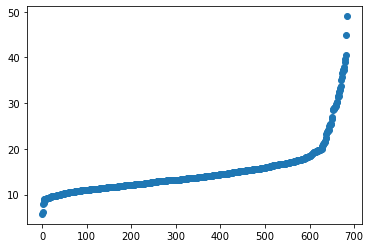

In [109]:
plt.scatter(x = range(unit_sales.shape[0]), y = np.sort(unit_sales))

In [111]:
train_subset_z = train_subset_d.copy()

In [125]:
train_subset_z['z_score'] = (train_subset_z['unit_sales'] - train_subset_z['unit_sales'].mean())/train_subset_z['unit_sales'].std(ddof=0)

<AxesSubplot:xlabel='date'>

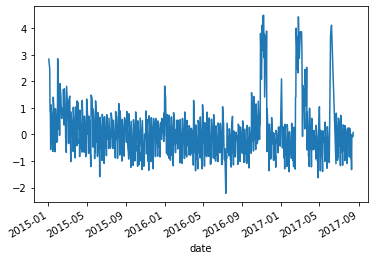

In [126]:
train_subset_z['z_score'].plot()

In [ ]:
train_subset_z[train_subset_z['z_score'] > 4]

In [133]:
#exclude the rows with z score more than 4
from scipy.stats import zscore
train_subset_z = train_subset_z[(np.abs(zscore(train_subset_z['z_score'])) < 2)]

In [134]:
unit_sales_z = train_subset_z['z_score'].values

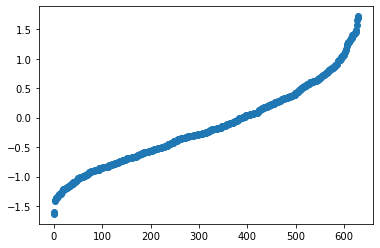

In [135]:
plt.scatter(x = range(unit_sales_z.shape[0]), y = np.sort(unit_sales_z))

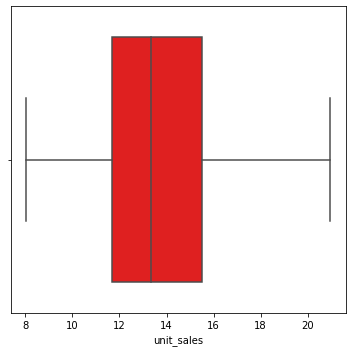

In [136]:
# Outlier Analysis
fig, axs = plt.subplots(1, figsize = (5,5))
plt1 = sns.boxplot(train_subset_z['unit_sales'],color='red')
plt.tight_layout()

### Standardisation

In [140]:
train_subset_s = train_subset_z.copy()

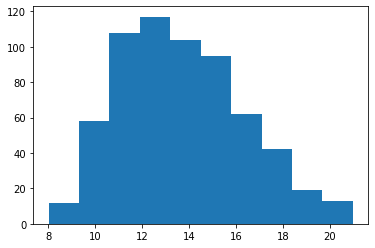

In [141]:
# histogram plot
plt.hist(train_subset_s['unit_sales'])
plt.show()

<AxesSubplot:ylabel='Density'>

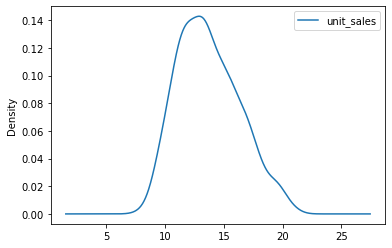

In [142]:
train_subset_s[['unit_sales']].plot(kind='density')

In [152]:
train_subset_ss = train_subset_s.copy()

In [153]:
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()
scaled_data = scale.fit_transform(train_subset_ss) 
print(scaled_data)

[[-1.50360062  0.18963256  0.         ... -0.01370167  0.19113711
   1.56898844]
 [-1.50131593 -0.39200476  0.         ...  0.0421089   0.29399518
   1.44615638]
 [-1.49906611 -2.19318476  0.         ...  3.16836728  0.30993093
  -0.60635804]
 ...
 [ 1.92293546  2.07964678  0.         ... -0.71033661  0.31137964
   0.23855803]
 [ 1.93130845  1.54923736  0.         ...  0.51613637  0.1346376
   0.11194607]
 [ 1.93537772  1.29226343  0.         ...  1.24076782  0.13174019
   0.3466458 ]]


In [154]:
train_subset_ss.drop(columns=['id','z_score'],inplace=True)


<AxesSubplot:ylabel='Density'>

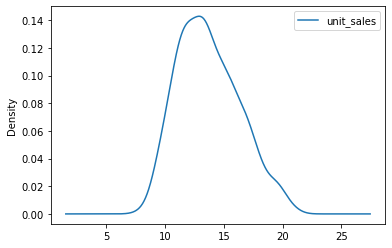

In [162]:
train_subset_ss[['unit_sales']].plot(kind='density')

## 5.5) Correlation

In [156]:
train_corr = train_subset_ss[['unit_sales','cluster','oil_price']].corr(method='pearson')
train_corr

,unit_sales,cluster,oil_price
unit_sales,1.000000,0.154469,0.055529
cluster,0.154469,1.000000,0.214583
oil_price,0.055529,0.214583,1.000000


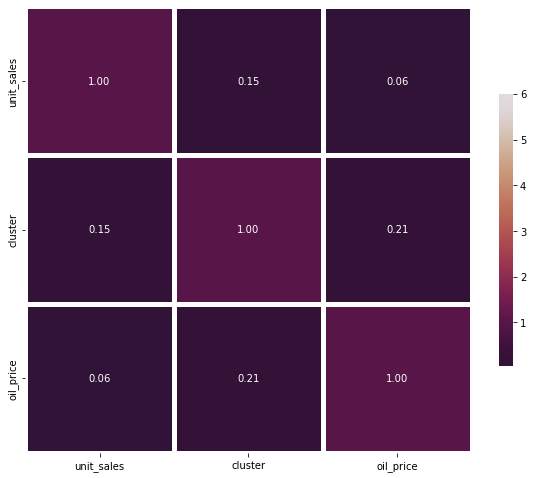

In [157]:
g = sns.heatmap(train_corr,vmax=6,center=0,
               square = True,linewidths=5,cbar_kws = {'shrink':.5},annot=True,fmt='.2f',cmap='twilight')
g.figure.set_size_inches(10,10)

# 6) TimeSeries Components - train_subset_d

## 6.1) Decomposition

In [182]:
df_decomp = train_subset_s.copy()

In [183]:
#df_decomp.setindex('date')

In [184]:
df_decomp

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,z_score,0
date,,,,,,,,,,,,,
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.901130,1.025769
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,0.817992,1.077729
2015-01-08,3.898065e+07,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,-0.571245,0.803205
2015-01-09,3.909918e+07,26.829457,208384.0,18.635659,2015.0,1.0,10.023256,2502.0,1.0,8.829457,48.35,1.114997,1.131473
2015-01-12,3.921770e+07,26.682927,208384.0,16.487805,2015.0,1.0,12.000000,2502.0,1.0,8.878049,46.06,0.558969,1.021124
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,-0.715370,1.071451
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,-1.323607,0.831598
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,0.000633,1.104985


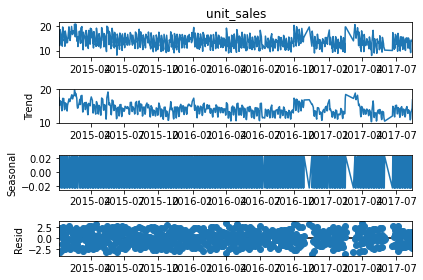

In [185]:
import statsmodels.api as sm
res = sm.tsa.seasonal_decompose(df_decomp['unit_sales'],
                                model='additive',period=2,extrapolate_trend='freq')

resplot = res.plot()

<AxesSubplot:xlabel='date'>

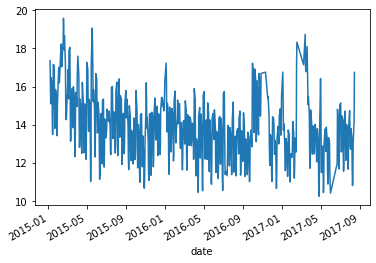

In [186]:
res.trend.plot()

<AxesSubplot:xlabel='date'>

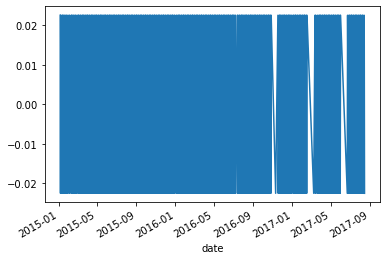

In [187]:
res.seasonal.plot()

<AxesSubplot:xlabel='date'>

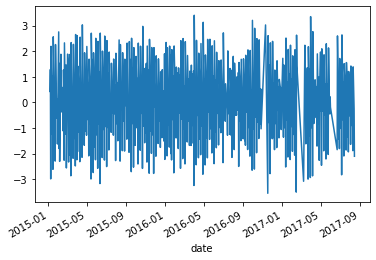

In [188]:
res.resid.plot()

In [189]:
res.observed #ACTUAL UNIT_SALES Value

date
2015-01-06    17.809524
2015-01-07    17.488372
2015-01-08    12.121951
2015-01-09    18.635659
2015-01-12    16.487805
                ...    
2017-08-09    11.565217
2017-08-10     9.215686
2017-08-11    14.331034
2017-08-14    14.000000
2017-08-15    14.613636
Name: unit_sales, Length: 630, dtype: float64

In [190]:
print(res.trend)

date
2015-01-06    17.362126
2015-01-07    16.227055
2015-01-08    15.091983
2015-01-09    16.470268
2015-01-12    16.146720
                ...    
2017-08-09    10.793977
2017-08-10    11.081906
2017-08-11    12.969439
2017-08-14    14.236168
2017-08-15    16.744504
Name: trend, Length: 630, dtype: float64


In [191]:
print(res.seasonal)

date
2015-01-06    0.022536
2015-01-07   -0.022536
2015-01-08    0.022536
2015-01-09   -0.022536
2015-01-12    0.022536
                ...   
2017-08-09   -0.022536
2017-08-10    0.022536
2017-08-11   -0.022536
2017-08-14    0.022536
2017-08-15   -0.022536
Name: seasonal, Length: 630, dtype: float64


In [192]:
res.trend[1] + res.seasonal[1] + res.resid[1]

17.488372093023255

### 6.1.a) Detrend the data

<AxesSubplot:xlabel='date'>

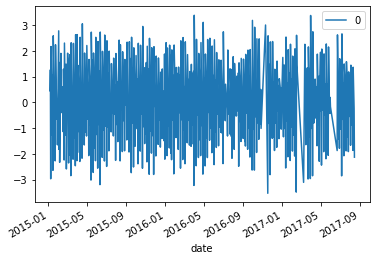

In [193]:
pd.DataFrame(res.observed-res.trend).plot()

In [194]:
detrend = pd.DataFrame(res.observed/res.trend)

In [195]:
#detrend.rename(columns = {0:'detrend_sales'},inplace=True)
detrend

,0
date,
2015-01-06,1.025769
2015-01-07,1.077729
2015-01-08,0.803205
2015-01-09,1.131473
2015-01-12,1.021124
...,...
2017-08-09,1.071451
2017-08-10,0.831598
2017-08-11,1.104985


<AxesSubplot:xlabel='date'>

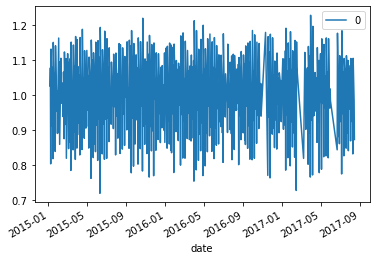

In [196]:
detrend.plot()

In [197]:
train_subset_sbkp = train_subset_s.copy()

In [198]:
train_subset_s = pd.concat([train_subset_s,detrend[0]],axis=1)

In [199]:
train_subset_s = train_subset_s.rename(columns={0:'unit_sales_detrend'})

<AxesSubplot:xlabel='date'>

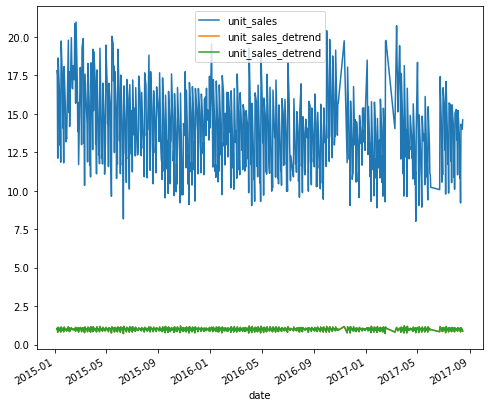

In [200]:
train_subset_s[['unit_sales','unit_sales_detrend']].plot(figsize=(8,7))

<AxesSubplot:xlabel='date'>

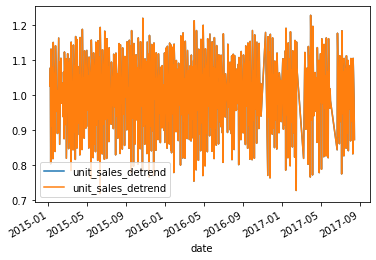

In [201]:
train_subset_s['unit_sales_detrend'].plot()

In [ ]:
#train_subset_s['unit_sales_detrend'] = train_subset_s['unit_sales_detrend'].fillna(method='bfill')

In [248]:
train_subset_s.isnull().sum()

store_nbr             0
item_nbr              0
unit_sales            0
Year                  0
Month                 0
Day                   0
class                 0
perishable            0
cluster               0
oil_price             0
unit_sales_detrend    0
dtype: int64

## 6.2) Handling Stationarity

### 6.2.1) ADF

In [249]:
train_subset_s.isnull().sum()

store_nbr             0
item_nbr              0
unit_sales            0
Year                  0
Month                 0
Day                   0
class                 0
perishable            0
cluster               0
oil_price             0
unit_sales_detrend    0
dtype: int64

In [250]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(train_subset_s['unit_sales_detrend'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -6.960266
p-value: 0.000000
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
Reject Ho - Time Series is Stationary


### 6.2.2) KPSS Test

In [251]:
from statsmodels.tsa.stattools import kpss
tstest = kpss(train_subset_s['unit_sales_detrend'],'ct')

C:\Users\u2195687\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




In [252]:
tstest

(0.043091579457022085,
 0.1,
 30,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

## 8.1) Simple Forecasting Models

In [253]:
train_subset_s

,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,unit_sales_detrend
date,,,,,,,,,,,
2015-01-02,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72,0.965907
2015-01-05,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05,1.051264
2015-01-06,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.925381
2015-01-07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,1.077729
2015-01-08,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,0.803205
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,1.071451
2017-08-10,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,0.831598
2017-08-11,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,1.104985


In [202]:
train_split = train_subset_s.loc['2015-01-01':'2017-08-08']

In [203]:
test_split = train_subset_s.loc['2017-08-09':'2017-08-15']

In [204]:
train_split

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,z_score,unit_sales_detrend,unit_sales_detrend
date,,,,,,,,,,,,,,
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.901130,1.025769,1.025769
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,0.817992,1.077729,1.077729
2015-01-08,3.898065e+07,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,-0.571245,0.803205,0.803205
2015-01-09,3.909918e+07,26.829457,208384.0,18.635659,2015.0,1.0,10.023256,2502.0,1.0,8.829457,48.35,1.114997,1.131473,1.131473
2015-01-12,3.921770e+07,26.682927,208384.0,16.487805,2015.0,1.0,12.000000,2502.0,1.0,8.878049,46.06,0.558969,1.021124,1.021124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-02,1.240871e+08,27.560000,208384.0,13.520000,2017.0,8.0,2.000000,2502.0,1.0,8.720000,49.60,-0.209324,1.052459,1.052459
2017-08-03,1.241925e+08,28.021277,208384.0,11.042553,2017.0,8.0,3.000000,2502.0,1.0,8.319149,49.03,-0.850675,0.868861,0.868861
2017-08-04,1.244067e+08,28.211921,208384.0,15.231788,2017.0,8.0,5.019868,2502.0,1.0,8.476821,49.57,0.233817,1.104569,1.104569


In [205]:
test_split

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,z_score,unit_sales_detrend,unit_sales_detrend
date,,,,,,,,,,,,,,
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,-0.715370,1.071451,1.071451
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,-1.323607,0.831598,0.831598
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,0.000633,1.104985,1.104985
2017-08-14,1.253419e+08,28.183673,208384.0,14.000000,2017.0,8.0,14.000000,2502.0,1.0,8.591837,47.59,-0.085063,0.983411,0.983411
2017-08-15,1.254443e+08,28.045455,208384.0,14.613636,2017.0,8.0,15.000000,2502.0,1.0,8.750000,47.57,0.073792,0.872742,0.872742


### 8.1.1) Simple Moving Average

In [219]:
df_sma = train_subset_s.copy()

In [223]:
train_subset_s.drop

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,z_score,unit_sales_detrend,unit_sales_detrend
date,,,,,,,,,,,,,,
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.901130,1.025769,1.025769
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,0.817992,1.077729,1.077729
2015-01-08,3.898065e+07,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,-0.571245,0.803205,0.803205
2015-01-09,3.909918e+07,26.829457,208384.0,18.635659,2015.0,1.0,10.023256,2502.0,1.0,8.829457,48.35,1.114997,1.131473,1.131473
2015-01-12,3.921770e+07,26.682927,208384.0,16.487805,2015.0,1.0,12.000000,2502.0,1.0,8.878049,46.06,0.558969,1.021124,1.021124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,-0.715370,1.071451,1.071451
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,-1.323607,0.831598,0.831598
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,0.000633,1.104985,1.104985


In [220]:
#df_sma = df_sma[['unit_sales_detrend']]

In [221]:
df_sma['ma_rolling_3'] = df_sma['unit_sales_detrend'].rolling(window=3).mean().shift(1)

ValueError: Expected a 1D array, got an array with shape (630, 2)

In [209]:
df_sma[['ma_rolling_3','unit_sales_detrend']].plot()

KeyError: "['ma_rolling_3'] not in index"

### 8.1.2 Weighted Moving average

In [296]:
def wma(weights):
    def calc(x):
        return (weights*x).mean()
    return calc

In [284]:
df_sma['wma_rolling_3'] = df_sma['unit_sales_detrend'].rolling(window=3).apply(wma(np.array([0.5,1,1.5]))).shift(1)

<AxesSubplot:xlabel='date'>

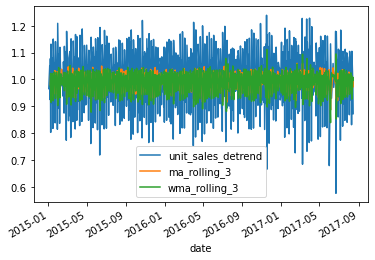

In [286]:
df_sma.plot()

### 8.1.3) Exponential Moving Average

In [287]:
df_sma['ewm_window_3'] = df_sma['unit_sales_detrend'].ewm(span=3,adjust=False,min_periods=0).mean().shift(1)

In [288]:
df_sma

,unit_sales_detrend,ma_rolling_3,wma_rolling_3,ewm_window_3
date,,,,
2015-01-02,0.965907,NaN,NaN,NaN
2015-01-05,1.051264,NaN,NaN,0.965907
2015-01-06,0.925381,NaN,NaN,1.008586
2015-01-07,1.077729,0.980851,0.974097,0.966983
2015-01-08,0.803205,1.018125,1.022536,1.022356
...,...,...,...,...
2017-08-09,1.071451,1.017325,0.987244,0.974140
2017-08-10,0.831598,1.006286,1.014307,1.022795
2017-08-11,1.104985,0.942378,0.926963,0.927196


<AxesSubplot:xlabel='date'>

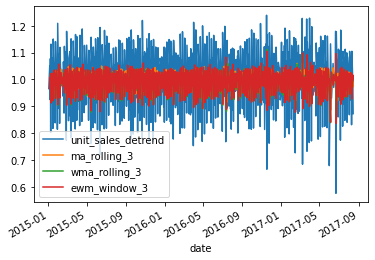

In [289]:
df_sma.plot()

### 8.1.4) Exponential smoothing 

In [290]:
df_sma['esm_window_3_7'] = df_sma['unit_sales_detrend'].ewm(alpha=0.7,adjust=False,min_periods=3).mean().shift(1)

<AxesSubplot:xlabel='date'>

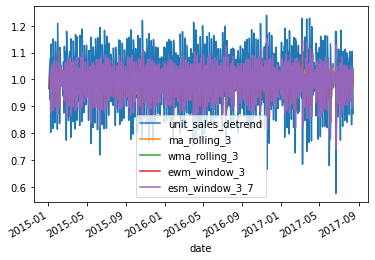

In [291]:
df_sma.plot()


In [292]:
df_sma['esm_window_3_3'] = df_sma['unit_sales_detrend'].ewm(alpha=0.3,adjust=False,min_periods=3).mean().shift(1)

<AxesSubplot:xlabel='date'>

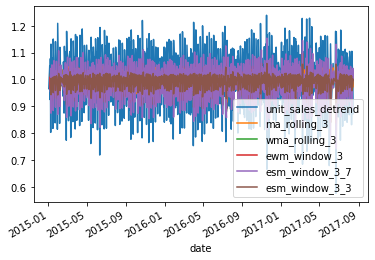

In [293]:
df_sma.plot()

In [295]:
print(rmse('unit_sales_detrend','ma_rolling_3'))
print(rmse('unit_sales_detrend','wma_rolling_3'))
print(rmse('unit_sales_detrend','ewm_window_3'))
print(rmse('unit_sales_detrend','esm_window_3_3'))
print(rmse('unit_sales_detrend','esm_window_3_7'))

0.13056240156275298
0.1456139776774582
0.1496423031319572
0.13368303601928214
0.16943458024765481


wma with rolling 3 is best

<AxesSubplot:xlabel='date'>

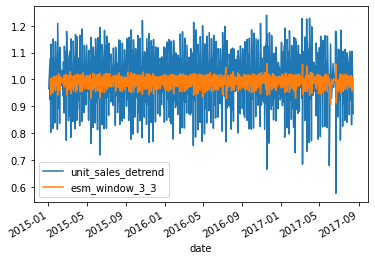

In [297]:
df_sma[['unit_sales_detrend','esm_window_3_3']].plot()

<AxesSubplot:xlabel='date'>

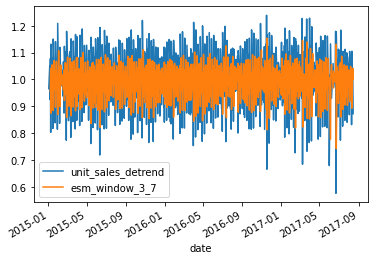

In [298]:
df_sma[['unit_sales_detrend','esm_window_3_7']].plot()

### 8.1.5) Triple Exponentail Smoothing Method/ Holt Winter’s Method 

In [299]:
train_data = train_split.copy()
test_data = test_split.copy()

In [7]:
from statsmodels.tsa.api import ExponentialSmoothing

holt_winter = ExponentialSmoothing(np.asarray(train_data['unit_sales_detrend']), seasonal_periods=1, trend='add', seasonal='add')
hw_fit = holt_winter.fit()

hw_forecast = hw_fit.forecast(len(test_data))

plt.figure(figsize=(8,6))

plt.plot(train_data.index, train_data['unit_sales_detrend'], "b.-", label='Train Data')
plt.plot(test_data.index, test_data['unit_sales_detrend'], "ro-", label='Original Test Data')
plt.plot(test_data.index, hw_forecast, "gx-", label='Holt_Winter Forecast Data')
plt.ylabel('Score', fontsize=16)
plt.xlabel('Time', fontsize=16)
plt.legend(loc='best')
plt.title('Holt Winters Forecast', fontsize=20)
plt.show()

NameError: name 'np' is not defined

In [312]:
forecast_range=pd.date_range(start='2015-01-02', periods=1038,freq='B')


In [313]:
forecast1_df = pd.DataFrame(hw_forecast[0],index =forecast_range,columns=['Prediction'])


In [314]:
forecast1_df

,Prediction
2015-01-02,0.980454
2015-01-05,0.980454
2015-01-06,0.980454
2015-01-07,0.980454
2015-01-08,0.980454
...,...
2018-12-19,0.980454
2018-12-20,0.980454
2018-12-21,0.980454
2018-12-24,0.980454


<AxesSubplot:>

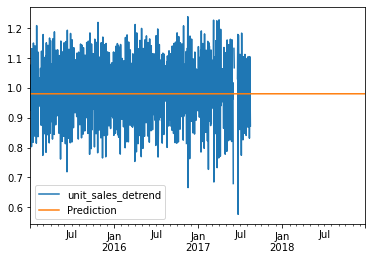

In [317]:
pd.concat([df_sma['unit_sales_detrend'],forecast1_df],axis=1).plot()

## 8.2) Linear Regression

In [321]:
train_subset_lr = train_subset_s.reset_index()

In [322]:
train_subset_lr

,date,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,unit_sales_detrend
0,2015-01-02,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72,0.965907
1,2015-01-05,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05,1.051264
2,2015-01-06,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.925381
3,2015-01-07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,1.077729
4,2015-01-08,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,0.803205
...,...,...,...,...,...,...,...,...,...,...,...,...
668,2017-08-09,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,1.071451
669,2017-08-10,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,0.831598
670,2017-08-11,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,1.104985
671,2017-08-14,28.183673,208384.0,14.000000,2017.0,8.0,14.000000,2502.0,1.0,8.591837,47.59,0.983411


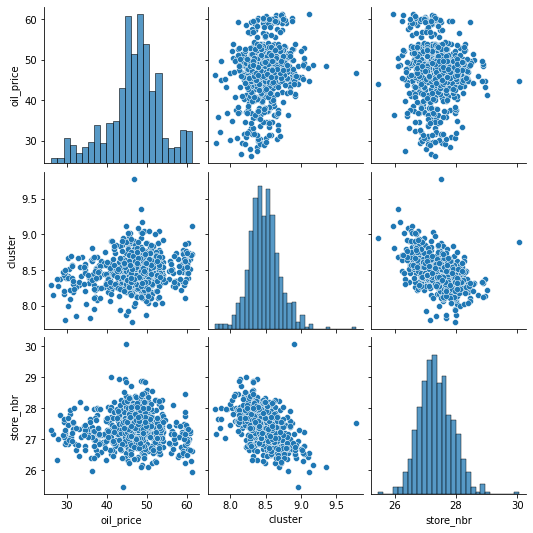

In [379]:
sns.pairplot(train_subset_lr[['oil_price', 'cluster','store_nbr']])
plt.show()

### Feature Selection

In [402]:
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

X = train_subset_lr [['oil_price','cluster','item_nbr']]
y = train_subset_lr.unit_sales_detrend

In [403]:
# Checking R_squared between oil price and cluster
lm1 = LinearRegression().fit(X[['oil_price','cluster']], y)
lm1_preds = lm1.predict(X[['oil_price','cluster']])

print("R^2: ", r2_score(y, lm1_preds))

R^2:  0.0007153240798720706


In [404]:
# Checking R_squared between oil price and item
lm2 = LinearRegression().fit(X[['oil_price','item_nbr']], y)
lm2_preds = lm2.predict(X[['oil_price','item_nbr']])

print("R^2: ", r2_score(y, lm2_preds))

R^2:  1.1807807247521396e-06


In [405]:
# Checking R_squared between all
# Checking R_squared between oil price and item
lm3 = LinearRegression().fit(X[['oil_price','item_nbr','cluster']], y)
lm3_preds = lm3.predict(X[['oil_price','item_nbr','cluster']])

print("R^2: ", r2_score(y, lm2_preds))

R^2:  1.1807807247521396e-06


In [406]:
# Model Evaluation using Train/Test and Metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Using all three features
X = train_subset_lr [['oil_price','cluster','item_nbr']]
y = train_subset_lr.unit_sales_detrend

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
lm4 = LinearRegression().fit(X_train, y_train)
lm4_preds = lm4.predict(X_test)

print("RMSE: ", np.sqrt(mean_squared_error(y_test, lm4_preds)))
print("R^2: ", r2_score(y_test, lm4_preds))

RMSE:  0.11095068099459755
R^2:  -0.017621770302635342


In [407]:
# Using just oil and item_nbr
X = train_subset_lr [['oil_price','item_nbr']]
y = train_subset_lr.unit_sales_detrend

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
lm5 = LinearRegression().fit(X_train, y_train)
lm5_preds = lm5.predict(X_test)

print("RMSE: ", np.sqrt(mean_squared_error(y_test, lm5_preds)))
print("R^2: ", r2_score(y_test, lm5_preds))

RMSE:  0.1105751283349548
R^2:  -0.010744412511485946


In [408]:
# Using just oil and cluster
X = train_subset_lr [['oil_price','cluster']]
y = train_subset_lr.unit_sales_detrend

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
lm6 = LinearRegression().fit(X_train, y_train)
lm6_preds = lm6.predict(X_test)

print("RMSE: ", np.sqrt(mean_squared_error(y_test, lm6_preds)))
print("R^2: ", r2_score(y_test, lm6_preds))

RMSE:  0.11095068099459755
R^2:  -0.017621770302635342


In [420]:
X = train_subset_lr [['oil_price']]

In [421]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [422]:
import statsmodels.api as sm

In [423]:
# Add a constant to get an intercept
X_train_sm = sm.add_constant(X_train)

# Fit the resgression line using 'OLS'
lr = sm.OLS(y_train, X_train_sm).fit()

In [424]:
# Performing a summary operation lists out all the different parameters of the regression line fitted
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:     unit_sales_detrend   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                   0.02030
Date:                Thu, 11 Aug 2022   Prob (F-statistic):              0.887
Time:                        13:59:04   Log-Likelihood:                 359.01
No. Observations:                 471   AIC:                            -714.0
Df Residuals:                     469   BIC:                            -705.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0014      0.036     27.732      0.0

In [425]:
lr.params

const        1.001449
oil_price   -0.000109
dtype: float64

In [426]:
y_train.shape

(471,)

In [430]:
X_train

,oil_price
425,48.48
270,29.45
626,48.32
41,49.59
462,50.72
...,...
578,47.02
53,44.63
350,44.58
79,56.59


In [351]:
y_train_pred = lr.predict(X_train_sm)
res = (y_train - y_train_pred)

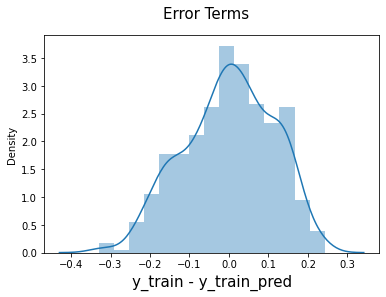

In [352]:
fig = plt.figure()
sns.distplot(res, bins = 15)
fig.suptitle('Error Terms', fontsize = 15)                  # Plot heading 
plt.xlabel('y_train - y_train_pred', fontsize = 15)         # X-label
plt.show()

In [354]:
# Add a constant to X_test
X_test_sm = sm.add_constant(X_test)

# Predict the y values corresponding to X_test_sm
y_pred = lr.predict(X_test_sm)

In [355]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [356]:
#Returns the mean squared error; we'll take a square root
np.sqrt(mean_squared_error(y_test, y_pred))

0.11675319306811796

In [357]:
r_squared = r2_score(y_test, y_pred)
r_squared

-0.001601265296459431

In [359]:
def rmse(x,y):
    return ((df_sma1[x]-df_sma1[y])**2).mean()**0.5

## 8.3) Prophet

In [354]:
#!pip install pystan fbprophet

In [225]:
from prophet import Prophet
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
import plotly.express as px

In [226]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
import plotly.express as px

mpl.rcParams['figure.figsize'] = (10, 8)
mpl.rcParams['axes.grid'] = False

In [227]:
train_subset_d

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
date,,,,,,,,,,,
2015-01-01,3.859434e+07,25.000000,208384.0,37.000000,2015.0,1.0,1.000000,2502.0,1.0,1.000000,52.72
2015-01-02,3.868373e+07,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72
2015-01-05,3.880926e+07,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81


In [228]:
df_pro = train_subset_d.copy()

In [229]:
df_pro

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price
date,,,,,,,,,,,
2015-01-01,3.859434e+07,25.000000,208384.0,37.000000,2015.0,1.0,1.000000,2502.0,1.0,1.000000,52.72
2015-01-02,3.868373e+07,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72
2015-01-05,3.880926e+07,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81


In [230]:
df_pro_a =df_pro.reset_index()[['date','unit_sales']].rename({'date':'ds','unit_sales':'y'}, axis='columns')

In [231]:
df_pro_a

,ds,y
0,2015-01-01,37.000000
1,2015-01-02,25.283465
2,2015-01-05,23.875000
3,2015-01-06,17.809524
4,2015-01-07,17.488372
...,...,...
679,2017-08-09,11.565217
680,2017-08-10,9.215686
681,2017-08-11,14.331034
682,2017-08-14,14.000000


In [362]:
train_pro=df_pro_a[(df_pro_a['ds'] >= '2015-01-01') & (df_pro_a['ds'] <= '2017-08-09')]
test_pro=df_pro_a[(df_pro_a['ds'] > '2017-08-09')]

In [363]:
m = Prophet(interval_width=0.95)

In [364]:
m.fit(train_pro)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [365]:
m.params

{'k': array([[-0.20307625]]),
 'm': array([[0.40567633]]),
 'delta': array([[ 2.96265647e-08, -1.93657889e-08,  1.02758042e-09,
          3.56155461e-08,  7.78639986e-07,  3.86204547e-08,
          6.32501253e-08,  5.15317152e-07,  2.11875993e-02,
          1.27107014e-01,  4.83192515e-02,  7.38308764e-04,
          1.16210653e-02,  6.51801466e-02,  1.29002130e-02,
          5.09266926e-03,  7.76091110e-02,  4.42338389e-02,
          5.07391058e-06,  5.55607315e-07,  6.23119163e-08,
          3.56734486e-09, -9.16373435e-09, -7.85404173e-10,
         -2.16774312e-10]]),
 'sigma_obs': array([[0.08169432]]),
 'beta': array([[ 0.00077601,  0.01891068, -0.00929047, -0.00071936,  0.01352288,
         -0.03175288, -0.0197339 , -0.01423064,  0.01827687,  0.01522351,
         -0.0108494 ,  0.01933649,  0.00963231,  0.02936677, -0.0091316 ,
          0.0003787 , -0.00874976,  0.00836957, -0.00099969, -0.01954495,
          0.11902853, -0.08683088, -0.06342737, -0.03068057,  0.01171921,
        

In [367]:
future = m.make_future_dataframe(periods=369,freq='B') # 4 is test data shape
forecast = m.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-01,19.883375,7.402336,22.815554,19.883375,19.883375,-5.048224,-5.048224,-5.048224,-6.315946,-6.315946,-6.315946,1.267722,1.267722,1.267722,0.0,0.0,0.0,14.835151
1,2015-01-02,19.872909,13.139322,28.308607,19.872909,19.872909,1.122328,1.122328,1.122328,-0.038028,-0.038028,-0.038028,1.160355,1.160355,1.160355,0.0,0.0,0.0,20.995236
2,2015-01-05,19.841510,10.002501,25.995669,19.841510,19.841510,-1.710533,-1.710533,-1.710533,-2.501158,-2.501158,-2.501158,0.790625,0.790625,0.790625,0.0,0.0,0.0,18.130976
3,2015-01-06,19.831044,7.957866,23.750538,19.831044,19.831044,-3.974578,-3.974578,-3.974578,-4.632479,-4.632479,-4.632479,0.657900,0.657900,0.657900,0.0,0.0,0.0,15.856465
4,2015-01-07,19.820578,8.449638,24.309336,19.820578,19.820578,-3.074199,-3.074199,-3.074199,-3.597140,-3.597140,-3.597140,0.522941,0.522941,0.522941,0.0,0.0,0.0,16.746379


In [368]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-01,19.883375,7.402336,22.815554,19.883375,19.883375,-5.048224,-5.048224,-5.048224,-6.315946,-6.315946,-6.315946,1.267722,1.267722,1.267722,0.0,0.0,0.0,14.835151
1,2015-01-02,19.872909,13.139322,28.308607,19.872909,19.872909,1.122328,1.122328,1.122328,-0.038028,-0.038028,-0.038028,1.160355,1.160355,1.160355,0.0,0.0,0.0,20.995236
2,2015-01-05,19.841510,10.002501,25.995669,19.841510,19.841510,-1.710533,-1.710533,-1.710533,-2.501158,-2.501158,-2.501158,0.790625,0.790625,0.790625,0.0,0.0,0.0,18.130976
3,2015-01-06,19.831044,7.957866,23.750538,19.831044,19.831044,-3.974578,-3.974578,-3.974578,-4.632479,-4.632479,-4.632479,0.657900,0.657900,0.657900,0.0,0.0,0.0,15.856465
4,2015-01-07,19.820578,8.449638,24.309336,19.820578,19.820578,-3.074199,-3.074199,-3.074199,-3.597140,-3.597140,-3.597140,0.522941,0.522941,0.522941,0.0,0.0,0.0,16.746379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,2019-01-02,27.217122,16.361576,32.865039,24.620198,29.968057,-2.436785,-2.436785,-2.436785,-3.597140,-3.597140,-3.597140,1.160355,1.160355,1.160355,0.0,0.0,0.0,24.780337
1045,2019-01-03,27.227992,14.180611,30.481006,24.621790,29.987978,-5.272306,-5.272306,-5.272306,-6.315946,-6.315946,-6.315946,1.043640,1.043640,1.043640,0.0,0.0,0.0,21.955687
1046,2019-01-04,27.238863,19.692211,36.967332,24.623289,30.007552,0.881726,0.881726,0.881726,-0.038028,-0.038028,-0.038028,0.919754,0.919754,0.919754,0.0,0.0,0.0,28.120589
1047,2019-01-07,27.271474,16.344628,33.119669,24.627787,30.064780,-1.978217,-1.978217,-1.978217,-2.501158,-2.501158,-2.501158,0.522941,0.522941,0.522941,0.0,0.0,0.0,25.293257


In [369]:
df_pro_a

,ds,y
0,2015-01-01,37.000000
1,2015-01-02,25.283465
2,2015-01-05,23.875000
3,2015-01-06,17.809524
4,2015-01-07,17.488372
...,...,...
679,2017-08-09,11.565217
680,2017-08-10,9.215686
681,2017-08-11,14.331034
682,2017-08-14,14.000000


In [370]:
forecast


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-01,19.883375,7.402336,22.815554,19.883375,19.883375,-5.048224,-5.048224,-5.048224,-6.315946,-6.315946,-6.315946,1.267722,1.267722,1.267722,0.0,0.0,0.0,14.835151
1,2015-01-02,19.872909,13.139322,28.308607,19.872909,19.872909,1.122328,1.122328,1.122328,-0.038028,-0.038028,-0.038028,1.160355,1.160355,1.160355,0.0,0.0,0.0,20.995236
2,2015-01-05,19.841510,10.002501,25.995669,19.841510,19.841510,-1.710533,-1.710533,-1.710533,-2.501158,-2.501158,-2.501158,0.790625,0.790625,0.790625,0.0,0.0,0.0,18.130976
3,2015-01-06,19.831044,7.957866,23.750538,19.831044,19.831044,-3.974578,-3.974578,-3.974578,-4.632479,-4.632479,-4.632479,0.657900,0.657900,0.657900,0.0,0.0,0.0,15.856465
4,2015-01-07,19.820578,8.449638,24.309336,19.820578,19.820578,-3.074199,-3.074199,-3.074199,-3.597140,-3.597140,-3.597140,0.522941,0.522941,0.522941,0.0,0.0,0.0,16.746379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,2019-01-02,27.217122,16.361576,32.865039,24.620198,29.968057,-2.436785,-2.436785,-2.436785,-3.597140,-3.597140,-3.597140,1.160355,1.160355,1.160355,0.0,0.0,0.0,24.780337
1045,2019-01-03,27.227992,14.180611,30.481006,24.621790,29.987978,-5.272306,-5.272306,-5.272306,-6.315946,-6.315946,-6.315946,1.043640,1.043640,1.043640,0.0,0.0,0.0,21.955687
1046,2019-01-04,27.238863,19.692211,36.967332,24.623289,30.007552,0.881726,0.881726,0.881726,-0.038028,-0.038028,-0.038028,0.919754,0.919754,0.919754,0.0,0.0,0.0,28.120589
1047,2019-01-07,27.271474,16.344628,33.119669,24.627787,30.064780,-1.978217,-1.978217,-1.978217,-2.501158,-2.501158,-2.501158,0.522941,0.522941,0.522941,0.0,0.0,0.0,25.293257


<AxesSubplot:xlabel='ds'>

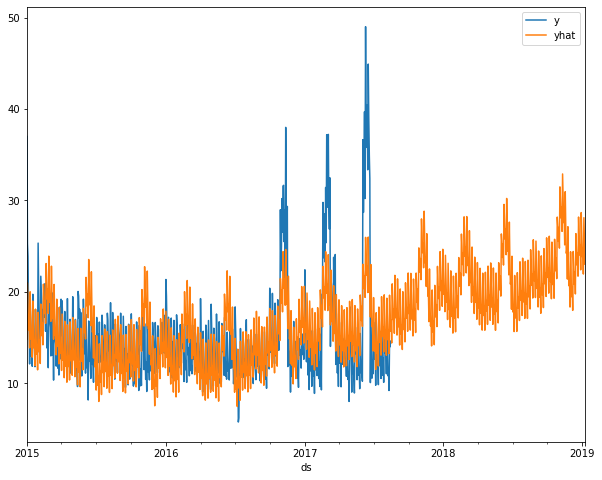

In [371]:
pd.concat([df_pro_a.set_index('ds')['y'],forecast.set_index('ds')['yhat']],axis=1).plot()

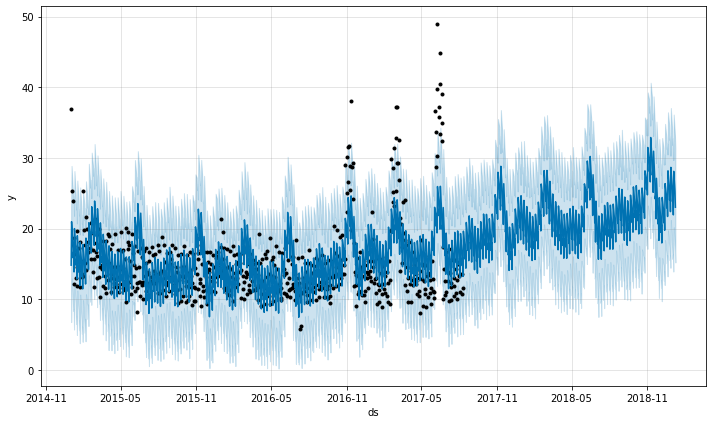

In [132]:
fig1 = m.plot(forecast)

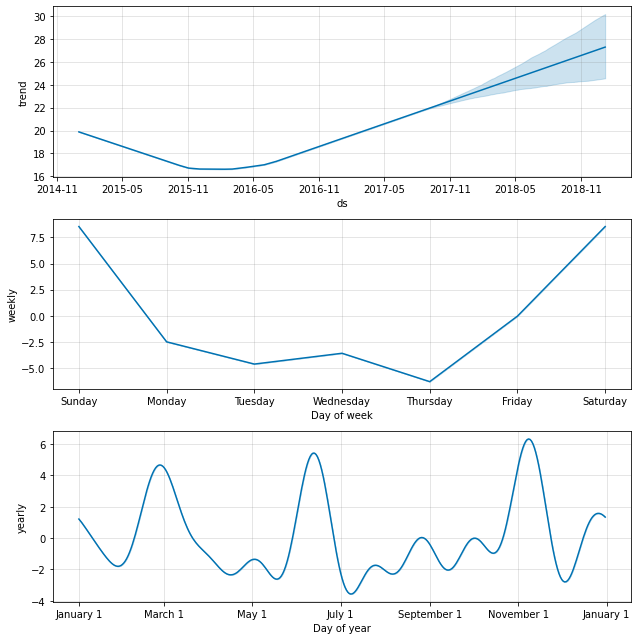

In [133]:
fig2 = m.plot_components(forecast)

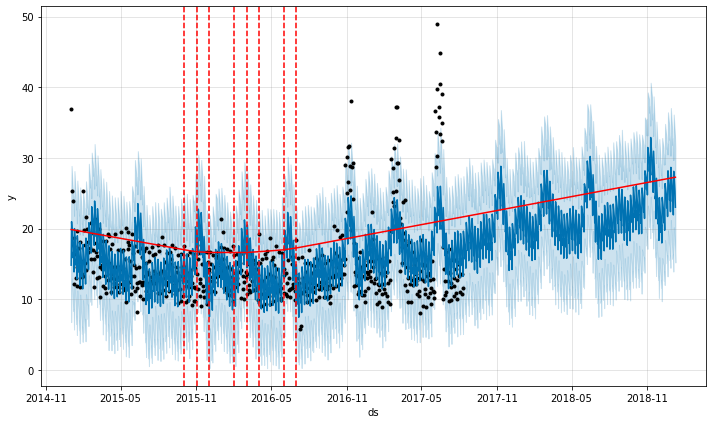

In [134]:
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


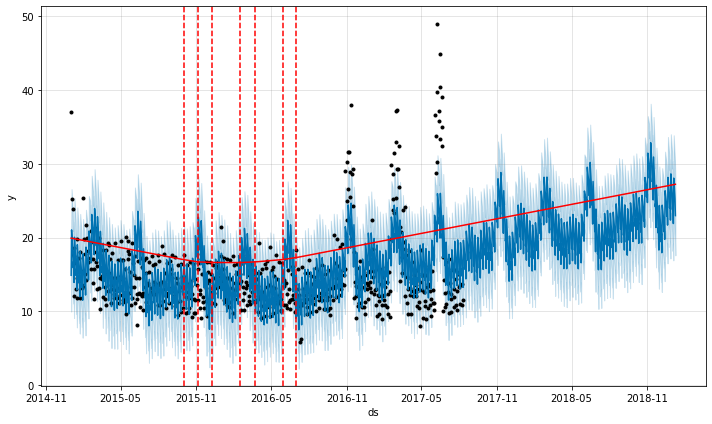

In [135]:
pro_change= Prophet(changepoint_range = 0.9, yearly_seasonality=True)
forecast = pro_change.fit(train_pro).predict(future)
fig= pro_change.plot(forecast);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

In [136]:
from prophet.diagnostics import cross_validation
cv_results = cross_validation( model = m, initial = '500 days', horizon = '365 days')

INFO:prophet:Making 1 forecasts with cutoffs between 2016-08-09 00:00:00 and 2016-08-09 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

In [137]:
cv_results.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2016-08-10,12.380294,9.181952,15.669640,11.043478,2016-08-09
1,2016-08-11,10.222304,6.915274,13.594560,11.795455,2016-08-09
2,2016-08-12,16.021210,12.743768,19.410305,14.654676,2016-08-09
3,2016-08-15,13.686909,10.138455,16.817045,13.460000,2016-08-09
4,2016-08-16,11.251272,7.845928,14.562157,13.595745,2016-08-09


In [7]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p.mean()

NameError: name 'cv_results' is not defined

## 8.4) AUTO ARIMA

In [433]:
df_arma = train_subset_s.copy() #copy for this model

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>], dtype=object)

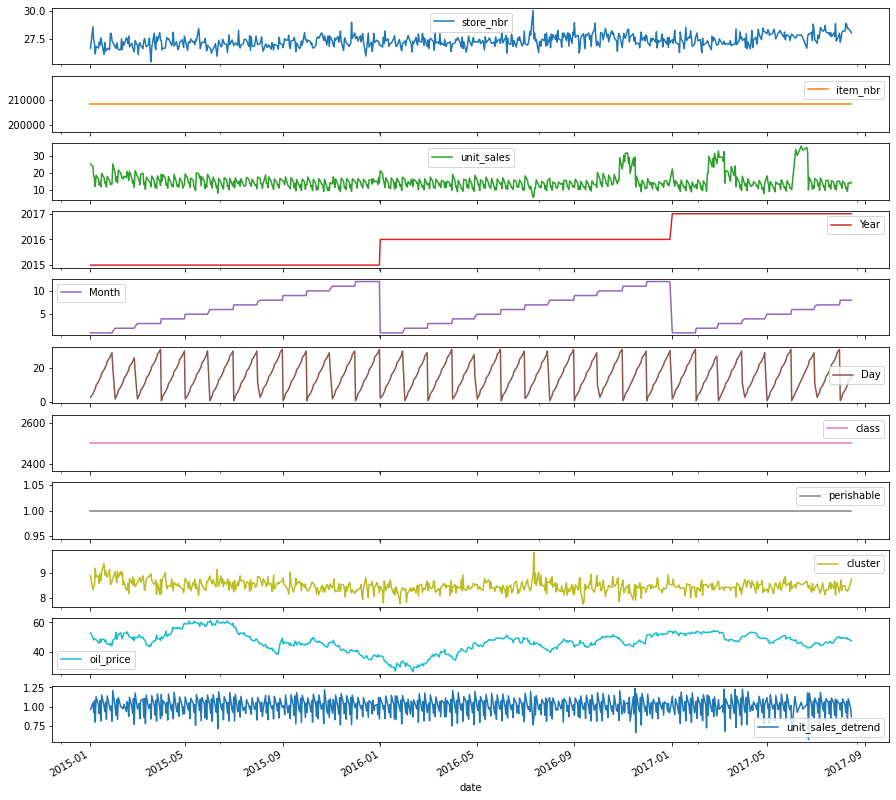

In [434]:

df_arma.plot(subplots=True,figsize=(15, 15))

array([<AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>, <AxesSubplot:xlabel='date'>,
       <AxesSubplot:xlabel='date'>], dtype=object)

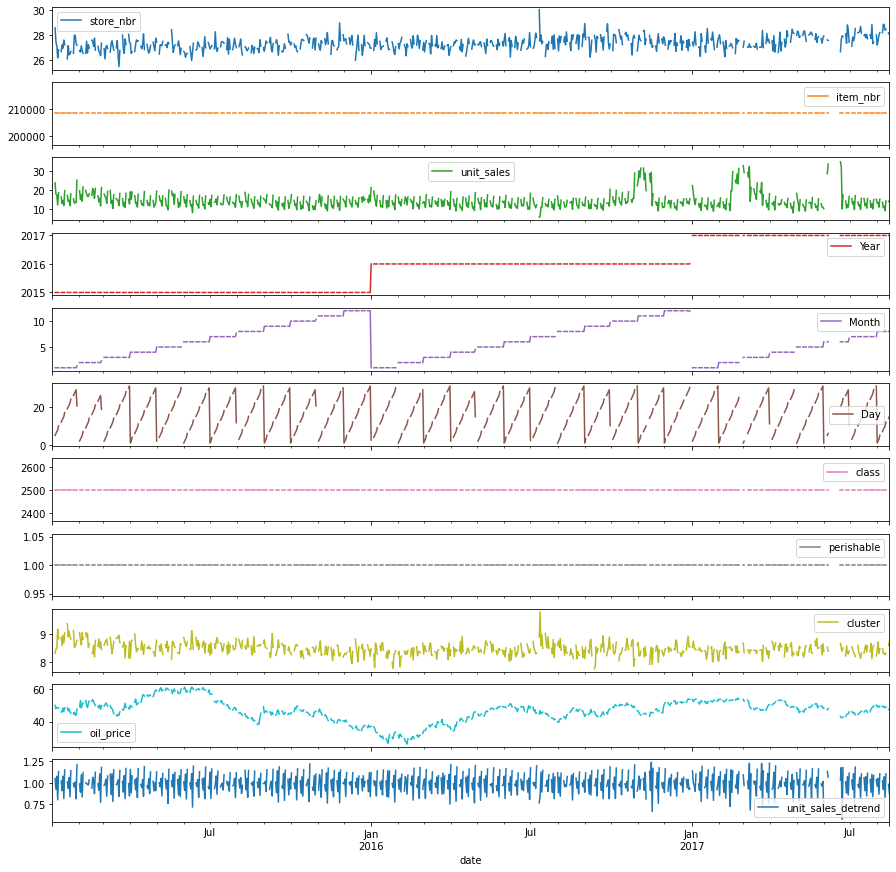

In [435]:
df_arma.resample('D').mean().plot(subplots=True,figsize=(15, 15)) # Equivalent to df_arma_monthly.plot()

In [666]:
df_arma.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 684 entries, 2015-01-01 to 2017-08-15
Freq: B
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          684 non-null    float64
 1   store_nbr   684 non-null    float64
 2   item_nbr    684 non-null    float64
 3   unit_sales  684 non-null    float64
 4   Year        684 non-null    float64
 5   Month       684 non-null    float64
 6   Day         684 non-null    float64
 7   class       684 non-null    float64
 8   perishable  684 non-null    float64
 9   cluster     684 non-null    float64
 10  oil_price   684 non-null    float64
 11  z_score     684 non-null    float64
dtypes: float64(12)
memory usage: 85.6 KB


In [667]:
!pip install pmdarima

Univariate

In [436]:
import pmdarima as pm

model_ar = pm.auto_arima(df_arma['unit_sales'],m=1,seasonal=True,
                        start_p=0,start_q=0,max_order=2,test='adf',error_action='ignore',
                        supress_warnings=True,stepwise=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3882.144, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3621.940, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3726.202, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5570.948, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3563.926, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=3559.641, Time=0.16 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=3561.634, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=3514.201, Time=0.47 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3554.559, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=3502.500, Time=0.45 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=3360.414, Time=0.42 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=3430.224, Time=0.28 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=3302.206, Time=0.58 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=3376.501, Time=0.70 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept

In [437]:
model_ar.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  673
Model:               SARIMAX(5, 0, 5)   Log Likelihood               -1561.188
Date:                Thu, 11 Aug 2022   AIC                           3146.376
Time:                        14:32:47   BIC                           3200.517
Sample:                             0   HQIC                          3167.342
                                - 673                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      4.8734      1.264      3.856      0.000       2.396       7.351
ar.L1         -0.0617      0.017     -3.717      0.000      -0.094      -0.029
ar.L2         -0.0775      0.016     -4.934      0.000      -0.108      -0.047
ar.L3         -0.0585      0.017     -3.393      0.001      -0.092      -0.025
ar.L4         -0.0598      0.017     -3.470      0.001      -0.094      -0.026
ar.L5          0.9117      0.016     55.671      0.000       0.880       0.944
ma.L1          0.6427      0.030     21.425      0.000       0.584       0.702
ma.L2          0.6928      0.036     19.452      0.000       0.623       0.763
ma.L3          0.6639      0.035     19.137      0.000       0.596       0.732
ma.L4          0.6216      0.039     15.931      0.000       0.545       0.698
ma.L5         -0.1524      0.028     -5.523      0.000      -0.206      -0.098
sigma2         5.9439      0.166     35.718      0.000       5.618       6.270
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):              4159.84
Prob(Q):                              0.75   Prob(JB):                         0.00
Heteroskedasticity (H):               4.23   Skew:                            -0.36
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [438]:
df_arma

,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,unit_sales_detrend
date,,,,,,,,,,,
2015-01-02,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72,0.965907
2015-01-05,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05,1.051264
2015-01-06,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.925381
2015-01-07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,1.077729
2015-01-08,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,0.803205
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,1.071451
2017-08-10,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,0.831598
2017-08-11,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,1.104985


In [439]:
train_arma = df_arma[(df_arma.index.get_level_values(0) >= '2015-01-01') &
                     (df_arma.index.get_level_values(0)<='2017-08-09')]
test_arma =df_arma[(df_arma.index.get_level_values(0) > '2017-08-09') ]

In [440]:
train_arma

,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,unit_sales_detrend
date,,,,,,,,,,,
2015-01-02,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72,0.965907
2015-01-05,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05,1.051264
2015-01-06,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.925381
2015-01-07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,1.077729
2015-01-08,26.170732,208384.0,12.121951,2015.0,1.0,8.000000,2502.0,1.0,9.170732,48.80,0.803205
...,...,...,...,...,...,...,...,...,...,...,...
2017-08-03,28.021277,208384.0,11.042553,2017.0,8.0,3.000000,2502.0,1.0,8.319149,49.03,0.868861
2017-08-04,28.211921,208384.0,15.231788,2017.0,8.0,5.019868,2502.0,1.0,8.476821,49.57,1.104569
2017-08-07,28.204082,208384.0,13.653061,2017.0,8.0,7.000000,2502.0,1.0,8.489796,49.37,1.023320


In [488]:
test_arma1 = test_arma.copy()
type(test_arma1)

pandas.core.frame.DataFrame

In [493]:
test_arma = forecast.copy()

AttributeError: 'tuple' object has no attribute 'copy'

In [492]:
test_arma1.append(pd.DataFrame({'date': pd.date_range(start=test_arma1.date.iloc[-1], periods=365, freq='B', closed='right')}))


AttributeError: 'DataFrame' object has no attribute 'date'

In [468]:
test_arma.index

DatetimeIndex(['2017-08-10', '2017-08-11', '2017-08-14', '2017-08-15'], dtype='datetime64[ns]', name='date', freq=None)

In [444]:
model_ar.fit(train_arma['unit_sales_detrend'])

ARIMA(order=(5, 0, 5), scoring_args={}, suppress_warnings=True)

In [494]:
forecast=model_ar.predict(n_periods=1028, return_conf_int=True)

In [495]:
forecast

(array([0.85480912, 1.09456215, 1.02003839, ..., 0.99532867, 0.99524774,
        0.99522933]),
 array([[0.76819099, 0.94142725],
        [0.96796061, 1.22116369],
        [0.89184112, 1.14823567],
        ...,
        [0.78862554, 1.20203179],
        [0.78854461, 1.20195086],
        [0.78852621, 1.20193245]]))

In [496]:
forecast_ar = pd.DataFrame(forecast[0],index = test_arma.index,columns=['Prediction'])

ValueError: Shape of passed values is (1028, 1), indices imply (4, 1)

In [497]:
forecast_ar 

,Prediction
date,
2017-08-10,0.854809
2017-08-11,1.094562
2017-08-14,1.020038
2017-08-15,0.927764


<AxesSubplot:xlabel='date'>

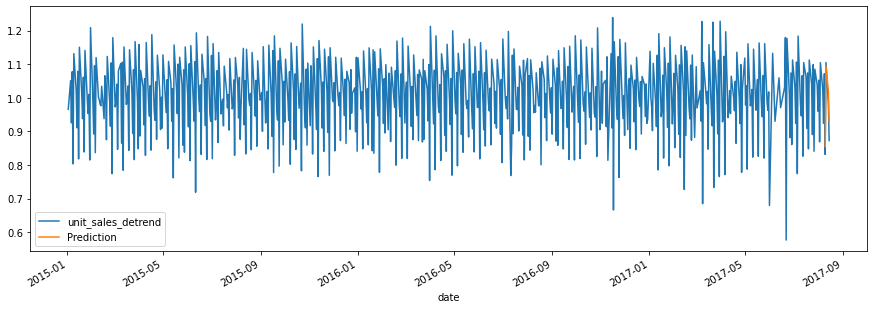

In [498]:
pd.concat([df_arma['unit_sales_detrend'],forecast_ar],axis=1).plot(figsize=(15,5))

In [499]:
forecast1=model_ar.predict(n_periods=36, return_conf_int=True)

In [500]:
forecast1

(array([0.85480912, 1.09456215, 1.02003839, 0.9277643 , 1.07178782,
        0.86702691, 1.0888275 , 1.02039243, 0.92770006, 1.07031592,
        0.87300646, 1.08414663, 1.02057954, 0.92778999, 1.06883024,
        0.87873442, 1.07963228, 1.02073247, 0.92800357, 1.06733583,
        0.88422023, 1.07528151, 1.02085297, 0.92833032, 1.06583482,
        0.88947338, 1.07109119, 1.02094272, 0.92876039, 1.06432928,
        0.89450306, 1.06705803, 1.02100328, 0.92928456, 1.06282123,
        0.8993181 ]),
 array([[0.76819099, 0.94142725],
        [0.96796061, 1.22116369],
        [0.89184112, 1.14823567],
        [0.79947782, 1.05605077],
        [0.94349943, 1.20007621],
        [0.73631728, 0.99773655],
        [0.95392449, 1.22373051],
        [0.8850222 , 1.15576265],
        [0.79230098, 1.06309915],
        [0.93491679, 1.20571505],
        [0.73547142, 1.01054151],
        [0.94290088, 1.22539238],
        [0.87891731, 1.16224177],
        [0.78611182, 1.06946816],
        [0.9271504 , 1.210

In [501]:
type(forecast1)

tuple

In [502]:
forecast_range=pd.date_range(start='2017-08-10', periods=36,freq='B')

In [503]:
forecast1_df = pd.DataFrame(forecast1[0],index =forecast_range,columns=['Prediction'])

<AxesSubplot:>

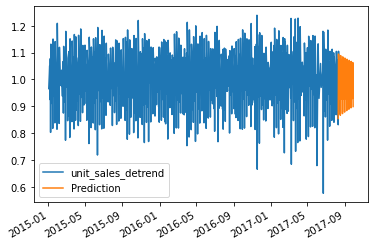

In [504]:
pd.concat([df_arma['unit_sales_detrend'],forecast1_df],axis=1).plot()

In [505]:
lower=pd.Series(forecast1[1][:, 0], index =forecast_range)
upper=pd.Series(forecast1[1][:, 1], index =forecast_range)

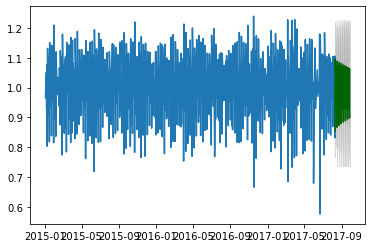

In [506]:
plt.plot(df_arma['unit_sales_detrend'])
plt.plot(forecast1_df, color='darkgreen')
plt.fill_between(forecast_range, 
                 lower, 
                 upper, 
                 color='k', alpha=.15)

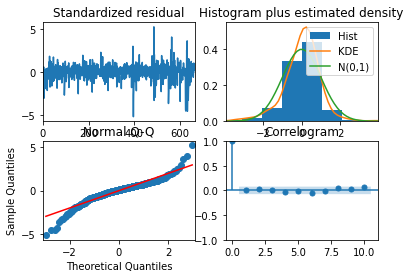

In [507]:
out=model_ar.plot_diagnostics()

### 8.2.1) Auto correlation (ACF and PACF plots)

In [508]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

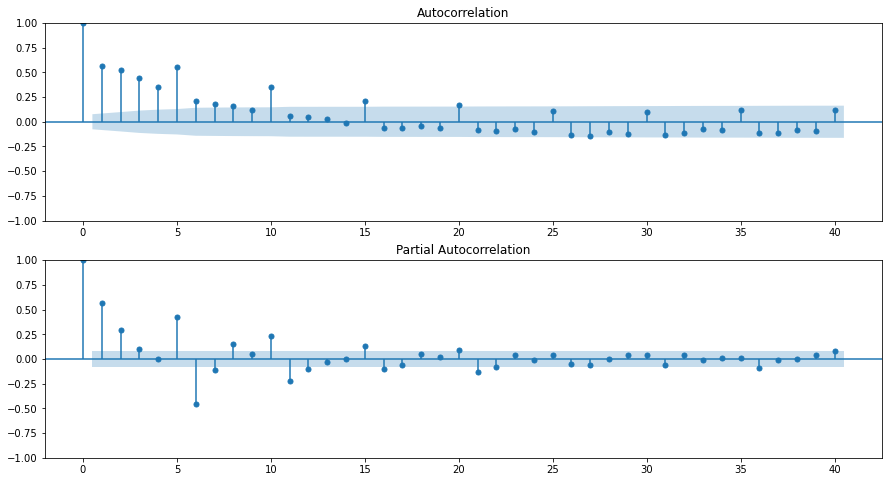

In [509]:
fig = plt.figure(figsize=(15,8))
ax1= fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_arma['unit_sales'].iloc[13:],lags=40,ax=ax1)
ax2= fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_arma['unit_sales'].iloc[13:],lags=40,ax=ax2)



In [510]:
import statsmodels.api as sm
#from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.arima.model import ARIMA
from datetime import datetime, timedelta


In [511]:
model_acf = ARIMA(df_arma['unit_sales'],order=(9,1,8))
model_acf_fit = model_acf.fit()

C:\Users\u2195687\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\u2195687\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\u2195687\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\u2195687\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [512]:
model_acf_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             unit_sales   No. Observations:                  673
Model:                 ARIMA(9, 1, 8)   Log Likelihood               -1554.274
Date:                Thu, 11 Aug 2022   AIC                           3144.548
Time:                        15:00:32   BIC                           3225.733
Sample:                             0   HQIC                          3175.990
                                - 673                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2009      0.868     -0.231      0.817      -1.903       1.501
ar.L2         -0.1918      0.734     -0.261      0.794      -1.631       1.247
ar.L3          0.0580      0.457      0.127      0.899      -0.838       0.954
ar.L4         -0.0350      0.144     -0.244      0.807      -0.316       0.246
ar.L5          0.8524      0.155      5.486      0.000       0.548       1.157
ar.L6          0.0676      0.772      0.088      0.930      -1.445       1.580
ar.L7          0.0467      0.593      0.079      0.937      -1.115       1.208
ar.L8         -0.1862      0.401     -0.464      0.643      -0.973       0.600
ar.L9         -0.0889      0.088     -1.004      0.315      -0.262       0.085
ma.L1         -0.2236      0.864     -0.259      0.796      -1.918       1.470
ma.L2          0.1523      0.759      0.201      0.841      -1.336       1.640
ma.L3         -0.2558      0.374     -0.684      0.494      -0.989       0.477
ma.L4         -0.0367      0.096     -0.381      0.703      -0.225       0.152
ma.L5         -0.7581      0.075    -10.052      0.000      -0.906      -0.610
ma.L6          0.0639      0.661      0.097      0.923      -1.232       1.360
ma.L7         -0.1117      0.570     -0.196      0.845      -1.228       1.005
ma.L8          0.2209      0.291      0.759      0.448      -0.349       0.791
sigma2         5.8969      0.172     34.195      0.000       5.559       6.235
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):              2655.09
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               4.16   Skew:                             0.09
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## 8.7) LSTM

In [72]:
train_subset_z

,id,store_nbr,item_nbr,unit_sales,Year,Month,Day,class,perishable,cluster,oil_price,z_score
date,,,,,,,,,,,,
2015-01-01,3.859434e+07,25.000000,208384.0,37.000000,2015.0,1.0,1.000000,2502.0,1.0,1.000000,52.72,4.129508
2015-01-02,3.868373e+07,26.661417,208384.0,25.283465,2015.0,1.0,2.968504,2502.0,1.0,8.881890,52.72,1.936839
2015-01-05,3.880926e+07,28.600000,208384.0,23.875000,2015.0,1.0,5.000000,2502.0,1.0,8.325000,50.05,1.673255
2015-01-06,3.886649e+07,27.452381,208384.0,17.809524,2015.0,1.0,6.000000,2502.0,1.0,8.476190,47.98,0.538143
2015-01-07,3.892401e+07,27.139535,208384.0,17.488372,2015.0,1.0,7.000000,2502.0,1.0,8.488372,48.69,0.478042
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-09,1.248265e+08,28.847826,208384.0,11.565217,2017.0,8.0,9.000000,2502.0,1.0,8.326087,49.59,-0.630436
2017-08-10,1.249255e+08,28.411765,208384.0,9.215686,2017.0,8.0,10.000000,2502.0,1.0,8.274510,48.54,-1.070134
2017-08-11,1.251311e+08,28.468966,208384.0,14.331034,2017.0,8.0,11.993103,2502.0,1.0,8.324138,48.81,-0.112832


In [108]:
df_input_lstm = train_subset_z[['unit_sales']]

In [109]:
df_input_lstm

,unit_sales
date,
2015-01-01,37.000000
2015-01-02,25.283465
2015-01-05,23.875000
2015-01-06,17.809524
2015-01-07,17.488372
...,...
2017-08-09,11.565217
2017-08-10,9.215686
2017-08-11,14.331034


In [110]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import tensorflow as tf

In [111]:
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_input_lstm)

In [112]:
features=data_scaled
target=data_scaled[:,0]

In [113]:
TimeseriesGenerator(features, target, length=2, sampling_rate=1, batch_size=1)[0]

(array([[[0.72222084],
         [0.45129471]]]),
 array([0.41872622]))

In [114]:
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.20, random_state=123, shuffle = False)
x_train.shape

(547, 1)

In [115]:
x_test.shape

(137, 1)

In [209]:
win_length=2
batch_size=10
num_features=1
train_generator = TimeseriesGenerator(x_train, y_train, length=win_length, sampling_rate=1, batch_size=batch_size)
test_generator = TimeseriesGenerator(x_test, y_test, length=win_length, sampling_rate=1, batch_size=batch_size)

In [210]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(128, input_shape= (win_length, num_features), return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5)) 
model.add(tf.keras.layers.LSTM(128, input_shape= (win_length, num_features), return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5)) 
model.add(tf.keras.layers.LSTM(128, return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5)) 
model.add(tf.keras.layers.Dropout(0.3)) 
model.add(tf.keras.layers.LSTM(64, return_sequences=False))
model.add(tf.keras.layers.Dropout(0.3)) 
model.add(tf.keras.layers.Dense(1))

In [211]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_27 (LSTM)              (None, 2, 128)            66560     
                                                                 
 leaky_re_lu_20 (LeakyReLU)  (None, 2, 128)            0         
                                                                 
 lstm_28 (LSTM)              (None, 2, 128)            131584    
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 2, 128)            0         
                                                                 
 lstm_29 (LSTM)              (None, 2, 128)            131584    
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 2, 128)            0         
                                                                 
 dropout_14 (Dropout)        (None, 2, 128)           

In [212]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=2,
                                                    mode='min')

model.compile(loss=tf.losses.MeanSquaredError(),
              optimizer=tf.optimizers.Adam(),
              metrics=[tf.metrics.MeanAbsoluteError()])

history = model.fit_generator(train_generator, epochs=50,
                    validation_data=test_generator,
                    shuffle=False,
                    callbacks=[early_stopping])

Epoch 1/50
55/55 [==============================] - 7s 37ms/step - loss: 0.0157 - mean_absolute_error: 0.0890 - val_loss: 0.0430 - val_mean_absolute_error: 0.1375
Epoch 2/50
55/55 [==============================] - 0s 8ms/step - loss: 0.0075 - mean_absolute_error: 0.0610 - val_loss: 0.0431 - val_mean_absolute_error: 0.1377
Epoch 3/50
55/55 [==============================] - 0s 8ms/step - loss: 0.0075 - mean_absolute_error: 0.0612 - val_loss: 0.0429 - val_mean_absolute_error: 0.1374
Epoch 4/50
55/55 [==============================] - 0s 9ms/step - loss: 0.0074 - mean_absolute_error: 0.0602 - val_loss: 0.0433 - val_mean_absolute_error: 0.1360
Epoch 5/50
55/55 [==============================] - 0s 8ms/step - loss: 0.0074 - mean_absolute_error: 0.0613 - val_loss: 0.0429 - val_mean_absolute_error: 0.1358
Epoch 6/50
55/55 [==============================] - 0s 8ms/step - loss: 0.0074 - mean_absolute_error: 0.0603 - val_loss: 0.0421 - val_mean_absolute_error: 0.1348
Epoch 7/50
55/55 [=========

In [213]:
model.evaluate_generator(test_generator, verbose=0) 

[0.013702061027288437, 0.08143825829029083]

In [ ]:
#************************
x_ = 
y_ = 
test_generator1 = TimeseriesGenerator(x_, y_, length=win_length, sampling_rate=1, batch_size=batch_size)

In [214]:
predictions=model.predict_generator(test_generator)

In [215]:
predictions.shape[0]

135

In [216]:
x_test[:,1:][win_length:]

array([], shape=(135, 0), dtype=float64)

In [217]:
df_pred_lstm =pd.concat([pd.DataFrame(predictions), pd.DataFrame(x_test[:,1:][win_length:])],axis=1)

In [218]:
df_pred_lstm 

,0
0,0.189010
1,0.179153
2,0.181271
3,0.181316
4,0.198735
...,...
130,0.188585
131,0.179047
132,0.177742
133,0.177730


In [219]:
rev_trans=scaler.inverse_transform(df_pred_lstm)

In [220]:
rev_trans

array([[13.940628 ],
       [13.514365 ],
       [13.605964 ],
       [13.60791  ],
       [14.361229 ],
       [13.660587 ],
       [13.899849 ],
       [18.461557 ],
       [22.317114 ],
       [29.187397 ],
       [25.025396 ],
       [25.378979 ],
       [27.625957 ],
       [25.95856  ],
       [30.50812  ],
       [29.556076 ],
       [36.743607 ],
       [32.752785 ],
       [32.4365   ],
       [35.823483 ],
       [29.298658 ],
       [29.207548 ],
       [27.779943 ],
       [15.09528  ],
       [20.492857 ],
       [18.87527  ],
       [16.32497  ],
       [15.070269 ],
       [16.540304 ],
       [22.220186 ],
       [17.626677 ],
       [18.987526 ],
       [19.632622 ],
       [14.194252 ],
       [15.063147 ],
       [14.101377 ],
       [13.670481 ],
       [13.728563 ],
       [13.832918 ],
       [15.041249 ],
       [13.941976 ],
       [13.923151 ],
       [13.885135 ],
       [13.706169 ],
       [14.606566 ],
       [13.870573 ],
       [13.820938 ],
       [13.93

In [221]:
df_final=df_input_lstm[predictions.shape[0]*-1:]

In [222]:
df_final.count()

unit_sales    135
dtype: int64

In [223]:
df_final['App_Pred']=rev_trans[:,0]

In [224]:
df_final

,unit_sales,App_Pred
date,,
2017-02-08,12.282609,13.940628
2017-02-09,9.653061,13.514365
2017-02-10,15.369128,13.605964
2017-02-13,12.780000,13.607910
2017-02-14,9.285714,14.361229
...,...,...
2017-08-09,11.565217,13.922263
2017-08-10,9.215686,13.509775
2017-08-11,14.331034,13.453347


<AxesSubplot:xlabel='date'>

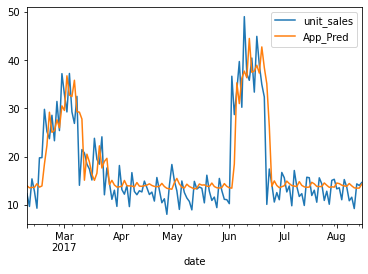

In [225]:
df_final[['unit_sales','App_Pred']].plot()

In [226]:
def rmse(x,y):
    return ((df_final[x]-df_final[y])**2).mean()**0.5

In [227]:
aa='unit_sales'
bb='App_Pred'

rmse(aa,bb)

5.06222291427495

# 9) Model Evaluation

In [45]:
def get_mape(actual, predicted):
    return np.round(np.mean(np.abs((actual-predicted) / actual))*100,2)

In [274]:
def rmse(x,y):
    return ((df_sma[x]-df_sma[y])**2).mean()**0.5

In [ ]:
# Calculate RMSE 
from sklearn.metrics import mean_squared_error
np.sqrt(mean_squared_error(df1['Energy_Production'][928:].values, df1['Moving Avg_12'][928:].values))

## Traditional Time series Models

ARIMA and Seasonal ARIMA
Autoregressive Integrated Moving Averages
The general process for ARIMA models is the following:

Visualize the Time Series Data
Make the time series data stationary
Plot the Correlation and AutoCorrelation Charts
Construct the ARIMA Model or Seasonal ARIMA based on the data
Use the model to make predictions
Let's go through these steps!

In [285]:
from pandas.tools.plotting import autocorrelation_plot
autocorrelation_plot(['Sales'])
plt.show()

ModuleNotFoundError: No module named 'pandas.tools'

In [294]:
df_ar = train_subset_s.copy()

In [296]:
df_ar_a =df_ar.reset_index()[['date','unit_sales_detrend']].rename({'date':'ds','unit_sales_detrend':'y'}, axis='columns')


In [297]:
train_ar=df_ar_a[(df_ar_a['ds'] >= '2015-01-01') & (df_ar_a['ds'] <= '2017-08-09')]
test_ar=df_ar_a[(df_ar_a['ds'] > '2017-08-09')]

In [301]:
df_ar_a

,ds,y,y
0,2015-01-06,1.025769,1.025769
1,2015-01-07,1.077729,1.077729
2,2015-01-08,0.803205,0.803205
3,2015-01-09,1.131473,1.131473
4,2015-01-12,1.021124,1.021124
...,...,...,...
625,2017-08-09,1.071451,1.071451
626,2017-08-10,0.831598,0.831598
627,2017-08-11,1.104985,1.104985
628,2017-08-14,0.983411,0.983411


In [303]:
df_ar_b = df_ar_a.iloc[:, :-1]

In [304]:
df_ar_b

,ds,y
0,2015-01-06,1.025769
1,2015-01-07,1.077729
2,2015-01-08,0.803205
3,2015-01-09,1.131473
4,2015-01-12,1.021124
...,...,...
625,2017-08-09,1.071451
626,2017-08-10,0.831598
627,2017-08-11,1.104985
628,2017-08-14,0.983411


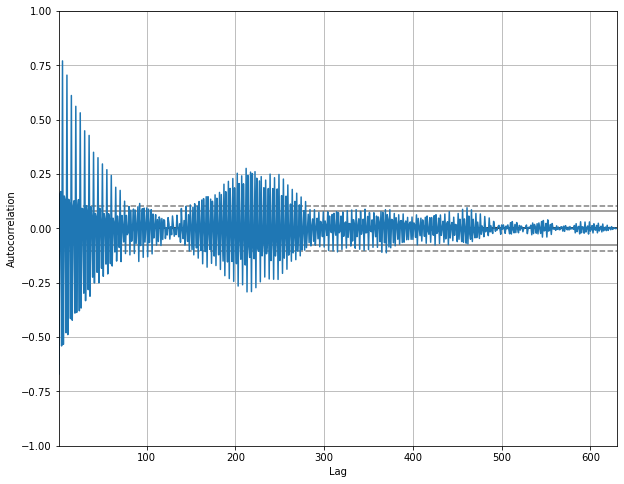

In [305]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(df_ar_b['y'])
plt.show()

Final Thoughts on Autocorrelation and Partial Autocorrelation
Identification of an AR model is often best done with the PACF.
For an AR model, the theoretical PACF “shuts off” past the order of the model. The phrase “shuts off” means that in theory the partial autocorrelations are equal to 0 beyond that point. Put another way, the number of non-zero partial autocorrelations gives the order of the AR model. By the “order of the model” we mean the most extreme lag of x that is used as a predictor.
Identification of an MA model is often best done with the ACF rather than the PACF.

For an MA model, the theoretical PACF does not shut off, but instead tapers toward 0 in some manner. A clearer pattern for an MA model is in the ACF. The ACF will have non-zero autocorrelations only at lags involved in the model.

p,d,q p AR model lags d differencing q MA lags

In [306]:
# For non-seasonal data
#p=1, d=1, q=0 or 1
from statsmodels.tsa.arima.model import ARIMA

In [307]:
df_ar_b

,ds,y
0,2015-01-06,1.025769
1,2015-01-07,1.077729
2,2015-01-08,0.803205
3,2015-01-09,1.131473
4,2015-01-12,1.021124
...,...,...
625,2017-08-09,1.071451
626,2017-08-10,0.831598
627,2017-08-11,1.104985
628,2017-08-14,0.983411


In [308]:
model=ARIMA(df_ar_b['y'],order=(7,0,6)) # specify order based on acf and pacf plot
model_fit=model.fit()

In [309]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  630
Model:                 ARIMA(7, 0, 6)   Log Likelihood                1137.258
Date:                Sat, 13 Aug 2022   AIC                          -2244.517
Time:                        20:01:49   BIC                          -2177.831
Sample:                             0   HQIC                         -2218.614
                                - 630                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9958      0.000   5543.558      0.000       0.995       0.996
ar.L1         -0.7841      0.964     -0.813      0.416      -2.674       1.106
ar.L2         -0.7878      1.211     -0.650      0.515      -3.162       1.586
ar.L3         -0.6176      1.282     -0.482      0.630      -3.130       1.895
ar.L4         -0.5978      1.258     -0.475      0.635      -3.063       1.868
ar.L5          0.3175      1.231      0.258      0.796      -2.095       2.730
ar.L6          0.1259      0.348      0.362      0.718      -0.557       0.808
ar.L7          0.1387      0.125      1.111      0.266      -0.106       0.383
ma.L1         -0.5155      0.962     -0.536      0.592      -2.401       1.370
ma.L2          0.1224      0.151      0.811      0.417      -0.173       0.418
ma.L3         -0.0317      0.136     -0.233      0.815      -0.298       0.235
ma.L4         -0.0380      0.120     -0.316      0.752      -0.273       0.198
ma.L5         -0.3771      0.058     -6.503      0.000      -0.491      -0.263
ma.L6          0.1670      0.383      0.436      0.663      -0.584       0.918
sigma2         0.0016   7.44e-05     21.096      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                79.65
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               1.24   Skew:                            -0.51
Prob(H) (two-sided):                  0.13   Kurtosis:                         4.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:>

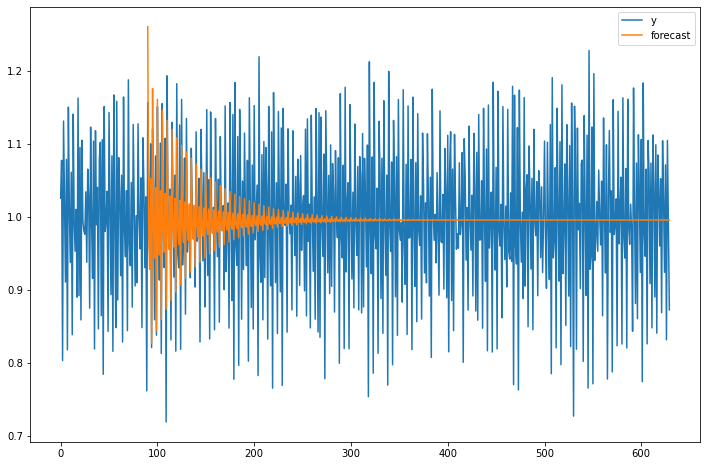

In [311]:
df_ar_b['forecast']=model_fit.predict(start=90,end=903,dynamic=True)
df_ar_b[['y','forecast']].plot(figsize=(12,8))

In [324]:
model=sm.tsa.statespace.SARIMAX(df_ar_b['y'],order=(6, 1, 6),seasonal_order=(1,1,1,12))
results=model.fit()

<AxesSubplot:>

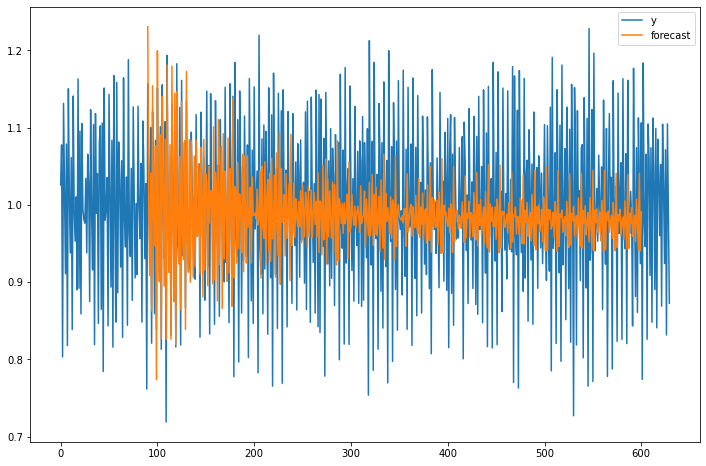

In [325]:
df_ar_b['forecast']=results.predict(start=90,end=600,dynamic=True)
df_ar_b[['y','forecast']].plot(figsize=(12,8))

In [331]:
model=sm.tsa.statespace.SARIMAX(df_ar_b['y'],order=(10, 0, 10),seasonal_order=(1,1,1,12))
results=model.fit()

<AxesSubplot:>

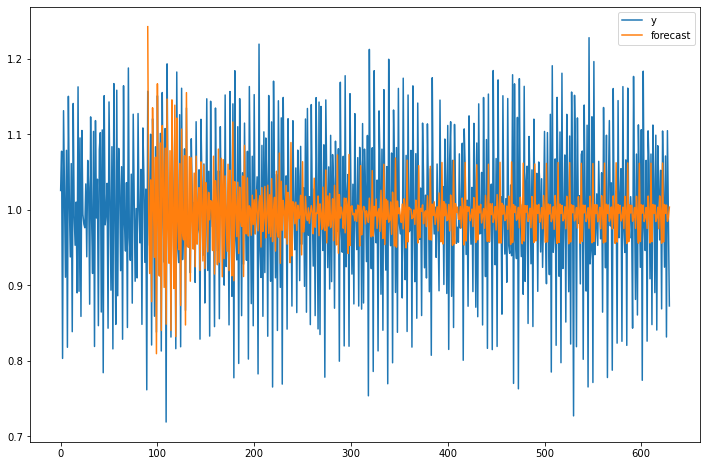

In [334]:
df_ar_b['forecast']=results.predict(start=90,end=1999,dynamic=True)
df_ar_b[['y','forecast']].plot(figsize=(12,8))

In [337]:
df_ar_b.set_index('ds')

,y,forecast
ds,,
2015-01-06,1.025769,NaN
2015-01-07,1.077729,NaN
2015-01-08,0.803205,NaN
2015-01-09,1.131473,NaN
2015-01-12,1.021124,NaN
...,...,...
2017-08-09,1.071451,0.995479
2017-08-10,0.831598,1.006370
2017-08-11,1.104985,0.984938


In [340]:
from pandas.tseries.offsets import DateOffset
future_dates=[df_ar_b.index[-1]+ DateOffset(day=x)for x in range(0,630)]

TypeError: unsupported operand type(s) for +: 'int' and 'DateOffset'

In [ ]:
future_datest_df=pd.DataFrame(index=future_dates[1:],columns=df_ar_b.columns)

In [ ]:
future_df=pd.concat([df,future_datest_df])

In [ ]:
future_df['forecast'] = results.predict(start = 104, end = 120, dynamic= True)  
future_df[['Sales', 'forecast']].plot(figsize=(12, 8)) 

# LSTM

In [ ]:
# demonstrate prediction for next 10 days
x_input = array([187, 196, 210])
temp_input=list(x_input)
lst_output=[]
i=0
while(i<10):
    
    if(len(temp_input)>3):
        x_input=array(temp_input[1:])
        print("{} day input {}".format(i,x_input))
        #print(x_input)
        x_input = x_input.reshape((1, n_steps, n_features))
        #print(x_input)
        yhat = model.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.append(yhat[0][0])
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output.append(yhat[0][0])
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps, n_features))
        yhat = model.predict(x_input, verbose=0)
        print(yhat[0])
        temp_input.append(yhat[0][0])
        lst_output.append(yhat[0][0])
        i=i+1
    

print(lst_output)